# Pump it up: Data Mining the water table

### Alejandro Torres

Score final: 0.8238

# Importación de paquetes

In [123]:
#EDA
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import scipy.stats as stats
from scipy.stats import chi2_contingency, fisher_exact

#Depuración
import missingno as msno
import sklearn.impute as skl_imp
from sklearn.experimental import enable_iterative_imputer
import feature_engine.imputation as fe_imp

#Codificación
import category_encoders as ce
from sklearn import preprocessing

#feature engineering
from optbinning import MulticlassOptimalBinning
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

#data modelling
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import VotingClassifier


#evaluation
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, classification_report


#setup
import warnings
warnings.simplefilter("ignore")

pd.set_option('display.max_columns', None)


# Funciones

In [75]:
def cramers_v(var1, varObj):
    """Función que calcula v de cramer en relación a la variable objetivo"""
    
    
    if not var1.dtypes == 'object':
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
    if not varObj.dtypes == 'object': #np.issubdtype(varObj, np.number):
        #bins = min(5,varObj.value_counts().count())
        varObj = pd.cut(varObj, bins = 5)
        
    data = pd.crosstab(var1, varObj).values
    vCramer = stats.contingency.association(data, method = 'cramer')
    return vCramer

In [80]:
def winsorize_with_pandas(s, limits):
    """
    Función para colapsar los valores extremos.

    s : pd.Series
        Series to winsorize
    limits : tuple of float
        Tuple of the percentages to cut on each side of the array, 
        with respect to the number of unmasked data, as floats between 0. and 1
    """
    return s.clip(lower=s.quantile(limits[0], interpolation='lower'), #clip colapsa en un límite
                  upper=s.quantile(1-limits[1], interpolation='higher'))

In [87]:
def gestiona_outliers(col,clas = 'check'):
       """
       - En check, calcula el porcentaje de valores extremos según 3 std o 8 mad.
       - En winsor, colapsa los valores extremos.
       - En miss, los valores extremos son declarados como nulos.
       """
       print(col.name)
       # Condición de asimetría y aplicación de criterio 1 según el caso
       if abs(col.skew()) < 1:
              criterio1 = abs((col-col.mean())/col.std())>3
       else:
              criterio1 = abs((col-col.median())/col.mad())>8
       
       # Calcular primer cuartil     
       q1 = col.quantile(0.25)  
       # Calcular tercer cuartil  
       q3 = col.quantile(0.75)
       # Calculo de IQR
       IQR=q3-q1
       # Calcular criterio 2 (general para cualquier asimetría)
       criterio2 = (col<(q1 - 3*IQR))|(col>(q3 + 3*IQR))
       lower = col[criterio1&criterio2&(col<q1)].count()/col.dropna().count()
       upper = col[criterio1&criterio2&(col>q3)].count()/col.dropna().count()
       # Salida según el tipo deseado
       if clas == 'check':
              return(lower*100,upper*100,(lower+upper)*100)
       elif clas == 'winsor':
              return(winsorize_with_pandas(col,(lower,upper)))
       elif clas == 'miss':
              print('\n MissingAntes: ' + str(col.isna().sum()))
              col.loc[criterio1&criterio2] = np.nan
              print('MissingDespues: ' + str(col.isna().sum()) +'\n')
              return(col)

In [88]:
def saca_metricas(y_true, y_pred, y_proba):

    print('matriz de confusión')
    print(confusion_matrix(y_true, y_pred))
    print('accuracy')
    print(accuracy_score(y_true, y_pred))
    print('precision')
    print(precision_score(y_true, y_pred, average='weighted')) 
    print('recall')
    print(recall_score(y_true, y_pred, average='weighted')) 
    print('f1')
    print(f1_score(y_true, y_pred, average='weighted'))
    print('ROC-AUC OvR: ')
    print(roc_auc_score(y_true, y_proba, multi_class='ovr'))
    print('ROC-AUC OvO: ')
    print(roc_auc_score(y_true, y_proba, multi_class='ovo'))

# Importación de los datos

In [89]:
train = pd.read_csv('C:\\Users\\User\\MASTER_BDDS\\10_Machine_learning_3\\Tarea\\data\\train_values.csv')
labels = pd.read_csv('C:\\Users\\User\\MASTER_BDDS\\10_Machine_learning_3\\Tarea\\data\\train_labels.csv')
test = pd.read_csv('C:\\Users\\User\\MASTER_BDDS\\10_Machine_learning_3\\Tarea\\data\\test_set.csv')

In [90]:
print(labels.shape)
print(train.shape)
print(test.shape)

(59400, 2)
(59400, 40)
(14850, 40)


In [91]:
#verificamos la coincidencia de los ids para saber si podemos concatenar sin problemas
print('Coincidencia ids train/test:\n', train['id'].isin(test['id']).value_counts())

Coincidencia ids train/test:
 False    59400
Name: id, dtype: int64


In [92]:
print('Comprobamos si las columnas son las mismas: \n ', test.columns.isin(train.columns))

Comprobamos si las columnas son las mismas: 
  [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


In [93]:
#columna id como índice
train.set_index('id', inplace=True)
labels.set_index('id', inplace=True)
test.set_index('id', inplace=True)

In [94]:
#guardamos los indices antes de concatenar para poder separar cuando sea necesario
indices_test = test.index.to_list()

#concatenamos los datos para el EDA a la vez que unimos la variable objetivo
df = pd.concat([train.join(labels), test])

data = df.copy(deep=True)

# Exploratory Data Analysis

In [95]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74250 entries, 69572 to 68707
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             74250 non-null  float64
 1   date_recorded          74250 non-null  object 
 2   funder                 69746 non-null  object 
 3   gps_height             74250 non-null  int64  
 4   installer              69718 non-null  object 
 5   longitude              74250 non-null  float64
 6   latitude               74250 non-null  float64
 7   wpt_name               74250 non-null  object 
 8   num_private            74250 non-null  int64  
 9   basin                  74250 non-null  object 
 10  subvillage             73780 non-null  object 
 11  region                 74250 non-null  object 
 12  region_code            74250 non-null  int64  
 13  district_code          74250 non-null  int64  
 14  lga                    74250 non-null  object 
 15

In [96]:
data.nunique()

amount_tsh                 102
date_recorded              369
funder                    2140
gps_height                2456
installer                 2410
longitude                71870
latitude                 71869
wpt_name                 45684
num_private                 68
basin                        9
subvillage               21425
region                      21
region_code                 27
district_code               20
lga                        125
ward                      2098
population                1128
public_meeting               2
recorded_by                  1
scheme_management           12
scheme_name               2868
permit                       2
construction_year           55
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity

In [97]:
#hemos encontrado dos columnas con metadata y etiquetas que son irrelevantes para el modelo
data.drop(columns=['date_recorded', 'recorded_by', 'wpt_name'], inplace=True)

#Region code se puede eliminar puesto que ya tenemos la variable region, la cual parece no presentar ninguna anomalía
#data.region.value_counts()
data.drop(columns='region_code', inplace=True)

#la variable district code es categórica, el resto de tipos de variables parecen estar bien asignados
data.district_code = data.district_code.astype('object')

In [98]:
#porcentaje de nulos declarados
data.isna().sum() / len(data) * 100

amount_tsh                0.000000
funder                    6.065993
gps_height                0.000000
installer                 6.103704
longitude                 0.000000
latitude                  0.000000
num_private               0.000000
basin                     0.000000
subvillage                0.632997
region                    0.000000
district_code             0.000000
lga                       0.000000
ward                      0.000000
population                0.000000
public_meeting            5.595960
scheme_management         6.526599
scheme_name              47.485522
permit                    5.108418
construction_year         0.000000
extraction_type           0.000000
extraction_type_group     0.000000
extraction_type_class     0.000000
management                0.000000
management_group          0.000000
payment                   0.000000
payment_type              0.000000
water_quality             0.000000
quality_group             0.000000
quantity            

In [99]:
data.select_dtypes(include=np.number).describe().round(2)

,amount_tsh,gps_height,longitude,latitude,num_private,population,construction_year
count,74250.00,74250.00,74250.00,74250.00,74250.00,74250.00,74250.00
mean,318.69,665.67,34.07,-5.70,0.46,180.75,1298.46
std,2906.76,692.76,6.57,2.94,11.54,471.09,952.35
min,0.00,-90.00,0.00,-11.65,0.00,0.00,0.00
25%,0.00,0.00,33.09,-8.53,0.00,0.00,0.00
50%,0.00,364.00,34.91,-5.03,0.00,25.00,1986.00
75%,20.00,1317.00,37.18,-3.33,0.00,215.00,2004.00
max,350000.00,2777.00,40.35,-0.00,1776.00,30500.00,2013.00


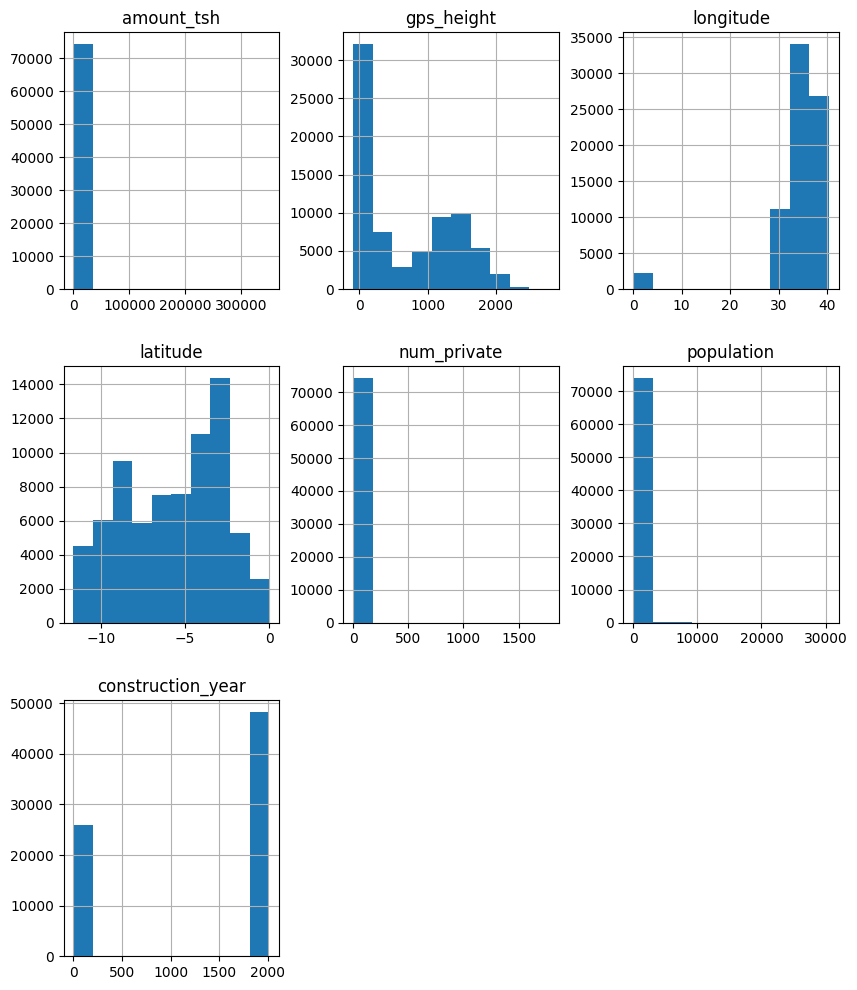

In [100]:
#histograma de las variables numéricas
plot = data.select_dtypes(include=np.number).hist(figsize=(10, 12))

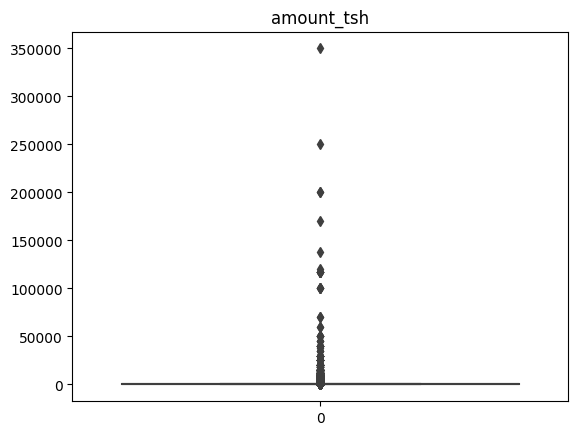

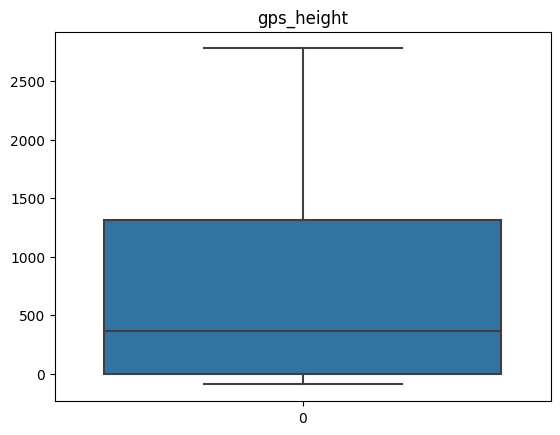

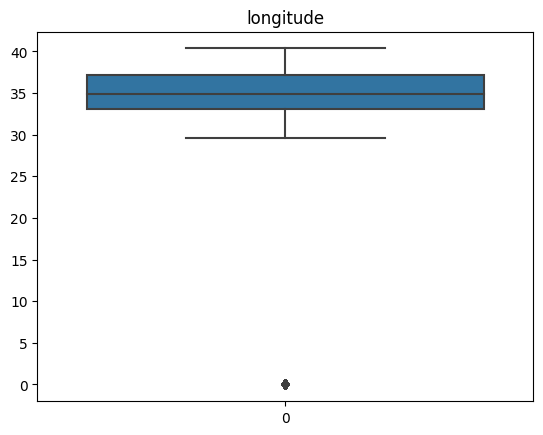

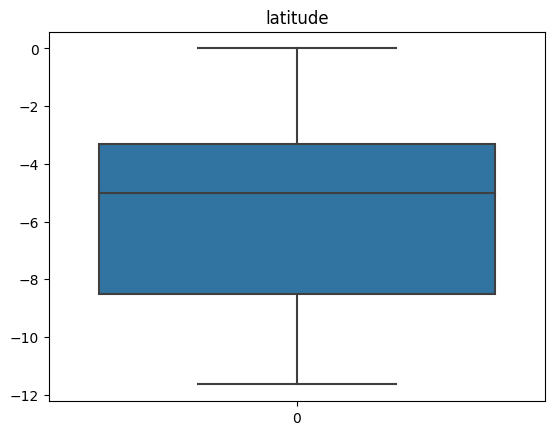

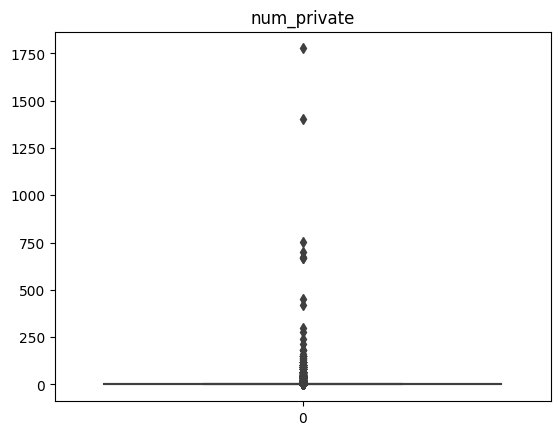

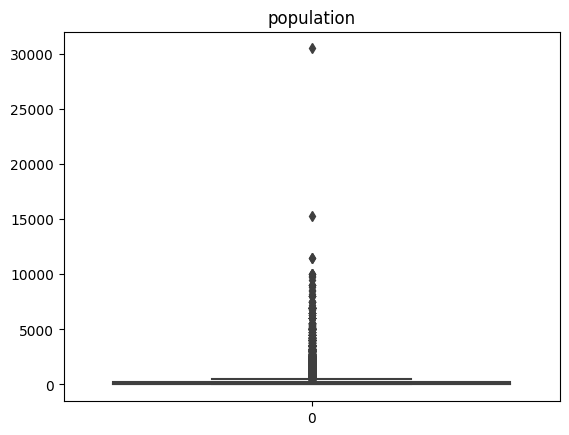

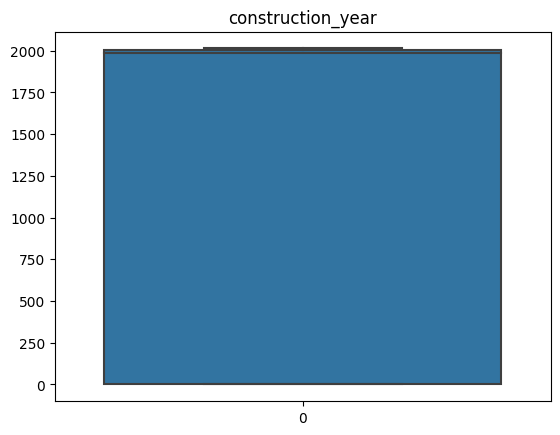

In [16]:
#boxplot de las variables numéricas

# for column in data.select_dtypes(include=np.number).columns:
#     plot= sns.boxplot(data[column])
#     plt.title(column)
#     plt.show()

Para el análisis, hemos utilizado la librería ydata_profiling, pero como requiere de un tiempo de ejecución, la hemos dejado comentada para ser ejecutada a gusto propio. De todas formas, nuestras conclusiones están detalladas a continuación.

In [17]:

#profile = ProfileReport(data, title="Profile Report Water Pumps")

In [18]:
#profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Cosas sobre las que deberemos prestar atención:

- Observamos valores extremos en amount_tsh y en population. 
- Gran porcentaje de 0s en amount_tsh, gps_height, population y construction_year
- eliminar num_private: además de que no tenemos la descripción de la variable, presenta un 98,7% de 0s
- Observar los 0s presentes en longitud y latitud
- seleccionar o transformar las columnas que acaban en _type, _group, _class para no duplicar información. Tener en cuenta el efecto de la colinealidad. Selección de variables.

NOTA: finalmente, decidimos utilizar algoritmos basados en árboles de decisión, que no se ven afectados por la colinealidad, así que no realizamos ningún tratamiento en este respecto.

- public_meeting, management_group, water_quality, quality_group con gran desbalanceo (mirar si requieren ser eliminadas o si se las puede tratar)
- funder, installer tiene una cardinalidad muy alta. Codificaremos las variables de manera que no aumenten innecesariamente la dimensionalidad del conjunto de datos.
- deberemos estudiar en mayor profundidad la presencia de correlación entre valores perdidos porque pueden haber patrones

### Estudio de variables con altos porcentajes de 0s

- Tras observar un mapa de la altitud de Tanzania, hemos observado que no es posible que gps_height == 0. 
- construction_year tampoco puede ser = 0
- No sabemos si los 0s en amount_tsh y population son legítimos

Tras el primer intento, nos dimos cuenta de que nos dejamos varios valores inválidos en el camino que también requerían ser depurados:

- Los negativos en gps_height

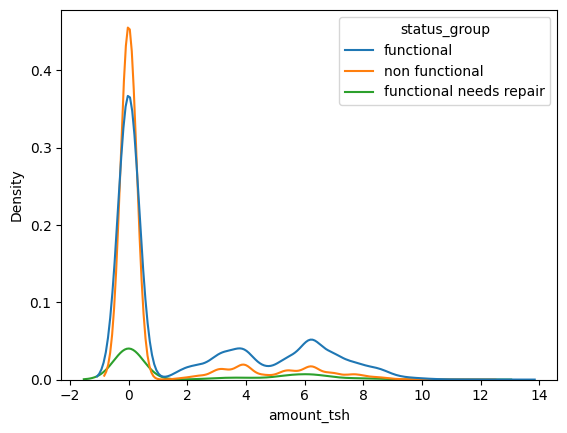

In [101]:
plot=sns.kdeplot(x=(np.log(data.amount_tsh+1)), hue=data.status_group)

In [102]:
print(data[data.amount_tsh <= 0].shape)
data[data.amount_tsh <= 0].head()

(52049, 36)


,amount_tsh,funder,gps_height,installer,longitude,latitude,num_private,basin,subvillage,region,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8776,0.0,Grumeti,1399,GRUMETI,34.698766,-2.147466,0,Lake Victoria,Nyamara,Mara,2,Serengeti,Natta,280,NaN,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
67743,0.0,Unicef,263,UNICEF,38.486161,-11.155298,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,63,Nanyumbu,Nanyumbu,58,True,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
19728,0.0,Action In A,0,Artisan,31.130847,-1.825359,0,Lake Victoria,Kyanyamisa,Kagera,1,Karagwe,Nyakasimbi,0,True,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
19816,0.0,Dwsp,0,DWSP,33.362410,-3.766365,0,Internal,Ishinabulandi,Shinyanga,3,Shinyanga Rural,Samuye,0,True,VWC,NaN,True,0,swn 80,swn 80,handpump,vwc,user-group,never pay,never pay,soft,good,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,non functional
54551,0.0,Rwssp,0,DWE,32.620617,-4.226198,0,Lake Tanganyika,Nyawishi Center,Shinyanga,3,Kahama,Chambo,0,True,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,wug,user-group,unknown,unknown,milky,milky,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,non functional


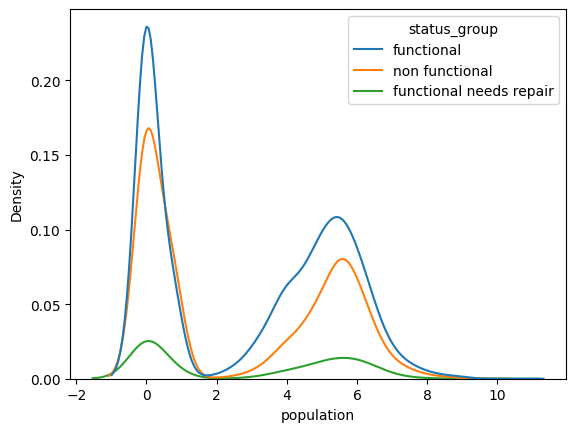

In [103]:
plot=sns.kdeplot(x=(np.log(data.population+1)), hue=data.status_group)

In [104]:
print(data[data.population <= 0].shape)
data[data.population <= 0].head()

(26834, 36)


,amount_tsh,funder,gps_height,installer,longitude,latitude,num_private,basin,subvillage,region,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
19728,0.0,Action In A,0,Artisan,31.130847,-1.825359,0,Lake Victoria,Kyanyamisa,Kagera,1,Karagwe,Nyakasimbi,0,True,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
19816,0.0,Dwsp,0,DWSP,33.362410,-3.766365,0,Internal,Ishinabulandi,Shinyanga,3,Shinyanga Rural,Samuye,0,True,VWC,NaN,True,0,swn 80,swn 80,handpump,vwc,user-group,never pay,never pay,soft,good,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,non functional
54551,0.0,Rwssp,0,DWE,32.620617,-4.226198,0,Lake Tanganyika,Nyawishi Center,Shinyanga,3,Kahama,Chambo,0,True,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,wug,user-group,unknown,unknown,milky,milky,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
53934,0.0,Wateraid,0,Water Aid,32.711100,-5.146712,0,Lake Tanganyika,Imalauduki,Tabora,6,Tabora Urban,Itetemia,0,True,VWC,NaN,True,0,india mark ii,india mark ii,handpump,vwc,user-group,never pay,never pay,salty,salty,seasonal,seasonal,machine dbh,borehole,groundwater,hand pump,hand pump,non functional
46144,0.0,Isingiro Ho,0,Artisan,30.626991,-1.257051,0,Lake Victoria,Mkonomre,Kagera,1,Karagwe,Kaisho,0,True,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,vwc,user-group,never pay,never pay,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional


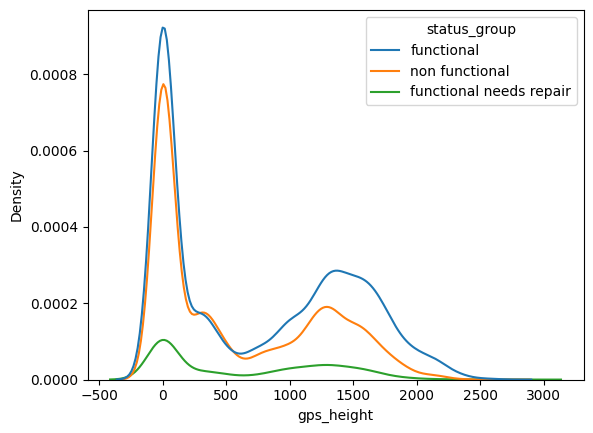

In [105]:
plot=sns.kdeplot(x=data.gps_height, hue=data.status_group)

In [106]:
print(data[data.gps_height <= 0].shape) #antes solo hicimos == en lugar de <=

(27530, 36)


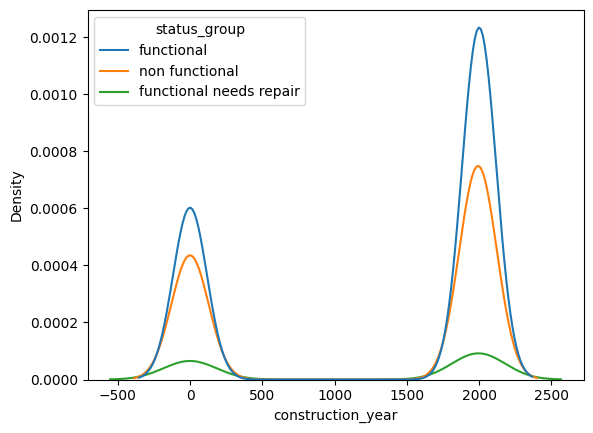

In [107]:
plot=sns.kdeplot(x=data.construction_year, hue=data.status_group)

Dada la distribución bimodal y especialmente por la ilegitimidad de los 0s en construction_year y gps_height, sospechamos que estos 0s correspondan a un patrón de valores faltantes. Por otro lado, no observamos ninguna iteracción alarmante respecto a la variable objetivo.

In [108]:
data[(data.amount_tsh <= 0)&(data.population<=0)&(data.gps_height <= 0)&(data.construction_year <= 0)]

,amount_tsh,funder,gps_height,installer,longitude,latitude,num_private,basin,subvillage,region,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
19728,0.0,Action In A,0,Artisan,31.130847,-1.825359e+00,0,Lake Victoria,Kyanyamisa,Kagera,1,Karagwe,Nyakasimbi,0,True,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
19816,0.0,Dwsp,0,DWSP,33.362410,-3.766365e+00,0,Internal,Ishinabulandi,Shinyanga,3,Shinyanga Rural,Samuye,0,True,VWC,NaN,True,0,swn 80,swn 80,handpump,vwc,user-group,never pay,never pay,soft,good,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,non functional
54551,0.0,Rwssp,0,DWE,32.620617,-4.226198e+00,0,Lake Tanganyika,Nyawishi Center,Shinyanga,3,Kahama,Chambo,0,True,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,wug,user-group,unknown,unknown,milky,milky,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
53934,0.0,Wateraid,0,Water Aid,32.711100,-5.146712e+00,0,Lake Tanganyika,Imalauduki,Tabora,6,Tabora Urban,Itetemia,0,True,VWC,NaN,True,0,india mark ii,india mark ii,handpump,vwc,user-group,never pay,never pay,salty,salty,seasonal,seasonal,machine dbh,borehole,groundwater,hand pump,hand pump,non functional
46144,0.0,Isingiro Ho,0,Artisan,30.626991,-1.257051e+00,0,Lake Victoria,Mkonomre,Kagera,1,Karagwe,Kaisho,0,True,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,vwc,user-group,never pay,never pay,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37994,0.0,Hesawa,0,DWE,0.000000,-2.000000e-08,0,Lake Victoria,Solima A,Mwanza,2,Magu,Kabita,0,True,VWC,NaN,True,0,nira/tanira,nira/tanira,handpump,vwc,user-group,never pay,never pay,salty,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,NaN
12592,0.0,Kirde,0,DWE,35.840727,-4.633272e+00,0,Internal,Cheke,Dodoma,1,Kondoa,Mnenia,0,True,VWC,Itun,False,0,gravity,gravity,gravity,vwc,user-group,pay monthly,monthly,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe,NaN
58693,0.0,Rwssp,0,DWE,32.442886,-3.644662e+00,0,Lake Tanganyika,Bukalangi,Shinyanga,3,Kahama,Ntobo,0,True,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,wug,user-group,unknown,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,NaN


24679 filas presentan 0s en las cuatro variables al mismo tiempo, parecería que hay un patrón... los declararemos como perdidos en amount_tsh y population puesto que parecen ilegítimos. Del resto de 0s en population y amount_tsh no nos aventuramos a afirmar nada, así que los dejamos ahí.

In [109]:
#declaramos como perdidos aquellos 0s que parecen corresponder a un patrón
condition = (data.amount_tsh <= 0)&(data.population<=0)&(data.gps_height <= 0)&(data.construction_year <= 0)
data.loc[condition, 'amount_tsh'] = np.nan
data.loc[condition, 'population'] = np.nan

In [110]:
#pasamos a null el resto de 0s en construction_year y gps_height porque son ilegítimos

#data.gps_height.replace(0, np.nan, inplace=True)
data.gps_height.where(data.gps_height >0 , np.nan, inplace=True) #corregimos el error para declarar nulos los negativos también
data.construction_year.replace(0, np.nan, inplace=True)

Verificamos que no haya ninguna correlación entre num_private y la variable objetivo.

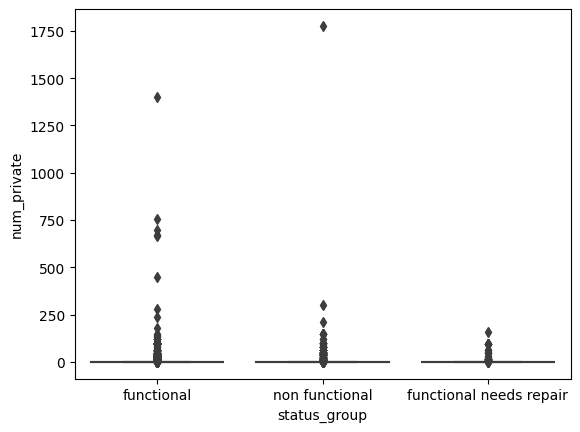

In [111]:
plot=sns.boxplot(y=data.num_private, x = data.status_group)

In [112]:
#como ya comentamos, eliminamos num_private porque con un 98,7% de 0s es prácticamente una constante

data.drop(columns='num_private', inplace=True)

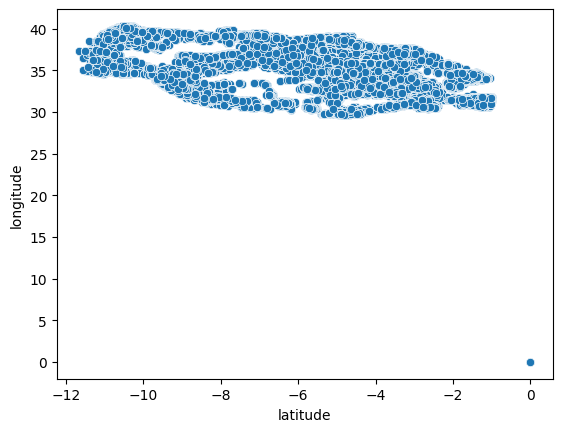

In [113]:
#longitud y latitud

plot=sns.scatterplot(x=data.latitude, y=data.longitude)

Esos 0s tienen toda la pinta de ser ilegítimos.

In [114]:
data[(data.latitude == -2*10**-8)&(data.longitude==0)][['longitude', 'latitude', 'region', 'subvillage', 'district_code', 'lga', 'ward', 'basin']]

,longitude,latitude,region,subvillage,district_code,lga,ward,basin
id,,,,,,,,
6091,0.0,-2.000000e-08,Shinyanga,Ibabachegu,1,Bariadi,Ikungulyabashashi,Lake Victoria
32376,0.0,-2.000000e-08,Mwanza,Center,6,Geita,Nyang'hwale,Lake Victoria
72678,0.0,-2.000000e-08,Shinyanga,Ilula,1,Bariadi,Chinamili,Lake Victoria
56725,0.0,-2.000000e-08,Shinyanga,Mahaha,1,Bariadi,Bunamhala,Lake Victoria
13042,0.0,-2.000000e-08,Mwanza,Nyamatala,2,Magu,Malili,Lake Victoria
...,...,...,...,...,...,...,...,...
30454,0.0,-2.000000e-08,Mwanza,Nyaweshi,6,Geita,Kharumwa,Lake Victoria
44766,0.0,-2.000000e-08,Mwanza,Busumabwi,1,Magu,Nkungulu,Lake Victoria
56279,0.0,-2.000000e-08,Mwanza,Madukani,2,Magu,Mkula,Lake Victoria


Estos valores en longitud y latitud parecen ilegítimos, puesto que pese a que las coordenadas son las mismas el resto de valores de localización son diferentes.

In [115]:
#revisamos que no esté asociado a Lake Victoria únicamente

data[(data.latitude > -0.00001)&(data.longitude==0)].basin.value_counts()

Lake Victoria      2145
Lake Tanganyika     124
Name: basin, dtype: int64

In [116]:
data.basin.value_counts() #podría ser casualidad perfectamente

Lake Victoria              12871
Pangani                    11143
Rufiji                      9987
Internal                    9642
Lake Tanganyika             8052
Wami / Ruvu                 7577
Lake Nyasa                  6332
Ruvuma / Southern Coast     5587
Lake Rukwa                  3059
Name: basin, dtype: int64

In [117]:
#los declaramos perdidos
data.loc[(data.latitude == -2*10**-8) & (data.longitude == 0), ['longitude', 'latitude']] = np.nan

In [118]:
data[['longitude', 'latitude']].isna().sum() #se han declarado valores perdidos correctamente

longitude    2269
latitude     2269
dtype: int64

## public_meeting, management_group, water_quality, quality_group con gran desbalanceo

In [119]:
unbalanced_cols = ['public_meeting', 'management_group', 'water_quality', 'quality_group']

for column in unbalanced_cols:
    print(data[column].value_counts(normalize=True))
    print('='*50)

True     0.909466
False    0.090534
Name: public_meeting, dtype: float64
user-group    0.882667
commercial    0.061832
parastatal    0.030020
other         0.016283
unknown       0.009199
Name: management_group, dtype: float64
soft                  0.855286
salty                 0.081912
unknown               0.031582
milky                 0.013535
coloured              0.008391
salty abandoned       0.005697
fluoride              0.003286
fluoride abandoned    0.000310
Name: water_quality, dtype: float64
good        0.855286
salty       0.087609
unknown     0.031582
milky       0.013535
colored     0.008391
fluoride    0.003596
Name: quality_group, dtype: float64


In [120]:
for column in unbalanced_cols:
    #frequency table
    ctable = pd.crosstab(data[column], data['status_group']) #normalize=1
    print(ctable)
    print('='*70)

    # Chi-square test of independence. 
    c, p, dof, expected = chi2_contingency(ctable) 
    if p < 0.05:
        print(p,'(Dependiente)')
    else:
        print(p,  '(Independiente)')
   
    print('='*70)

status_group    functional  functional needs repair  non functional
public_meeting                                                     
False                 2173                      442            2440
True                 28408                     3719           18884
2.409417730738095e-66 (Dependiente)
status_group      functional  functional needs repair  non functional
management_group                                                     
commercial              2235                      117            1286
other                    528                       56             359
parastatal              1020                      211             537
unknown                  224                       27             310
user-group             28252                     3906           20332
1.7446261385260022e-57 (Dependiente)
status_group        functional  functional needs repair  non functional
water_quality                                                          
coloured             

In [121]:
tablaCramer = pd.DataFrame(data.apply(lambda x: cramers_v(x,data.status_group)),columns=['VCramer'])

In [124]:
tablaCramer.sort_values(by='VCramer', ascending=False).style.background_gradient(cmap='coolwarm').set_precision(2)

,VCramer
status_group,1.00
subvillage,0.68
scheme_name,0.59
ward,0.47
installer,0.36
funder,0.36
lga,0.31
quantity_group,0.31
quantity,0.31
waterpoint_type,0.25


Los resultados obtenidos en el test de contingencia y por el valor de V de Cramer son contradictorios y no logramos determinar si hay una relación significativa o no entre las variables desbalanceadas y la variable objetivo. Por lo tanto, mantendremos las variables en el data set y las incluiremos en el modelo. En caso de que su aporte sea bajo, las eliminaremos, de lo contrario las mantendremos.

## funder, installer, alta cardinalidad

In [125]:
data.funder.nunique()

2140

In [126]:
data.installer.nunique()

2410

In [127]:
data.funder.value_counts(normalize=True).head()

Government Of Tanzania    0.162002
Danida                    0.056018
Hesawa                    0.039888
Rwssp                     0.024417
World Bank                0.024388
Name: funder, dtype: float64

In [128]:
data.installer.value_counts(normalize=True).head()

DWE           0.311985
Government    0.032732
RWE           0.021487
Commu         0.019321
DANIDA        0.018718
Name: installer, dtype: float64

No parece sencillo reagrupar las categorías minoritarias puesto que perderíamos demasiada información, así que trataremos de aplicar métodos de codificación que no aumenten demasiado la dimensionalidad como frequency encoding.

# Depuración

In [129]:
data_dep = data.copy(deep=True)

## Outliers

Llevamos a cabo un conteo de los valores que se consideran extremos según un consenso de dos criterios distintos. En primer lugar, se distingue si la variable es simétrica o no, para aplicar media + 3 sd o mediana + 8 mad, respectivamente, y que los valores que superen el umbral sean considerados atípicos.

In [130]:
data_dep.select_dtypes(include=np.number).apply(lambda x: gestiona_outliers(x))

amount_tsh
gps_height
longitude
latitude
population
construction_year


,amount_tsh,gps_height,longitude,latitude,population,construction_year
0,0.000000,0.0,0.0,0.0,0.000000,0.0
1,1.196264,0.0,0.0,0.0,1.163987,0.0
2,1.196264,0.0,0.0,0.0,1.163987,0.0


La presencia de valores atípicos es baja (entre 1-2%) en amount y pop.

Intentaremos corregir el skew en amount_tsh y en population transformandolas en logarítmicas

In [131]:
data_dep['amount_tsh_log'] = np.log(data_dep.amount_tsh + 1)
data_dep['population_log'] = np.log(data_dep.population + 1)

In [132]:
data_dep.select_dtypes(include=np.number).apply(lambda x: gestiona_outliers(x))

amount_tsh
gps_height
longitude
latitude
population
construction_year
amount_tsh_log
population_log


,amount_tsh,gps_height,longitude,latitude,population,construction_year,amount_tsh_log,population_log
0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,1.196264,0.0,0.0,0.0,1.163987,0.0,0.0,0.0
2,1.196264,0.0,0.0,0.0,1.163987,0.0,0.0,0.0


Parece que hemos logrado corregir el impacto de los valores extremos con la transformación logarítmica. Mantendremos las variables sin la transformación para poder escoger cuál funciona mejor en el modelo.

In [133]:
tablaCramer = pd.DataFrame(data_dep.apply(lambda x: cramers_v(x, data_dep.status_group)),columns=['VCramer'])

In [134]:
tablaCramer.sort_values(by='VCramer', ascending=False).style.background_gradient(cmap='coolwarm')

,VCramer
status_group,1.000000
subvillage,0.682880
scheme_name,0.588342
ward,0.469122
installer,0.363391
funder,0.356483
lga,0.311533
quantity_group,0.309240
quantity,0.309240
waterpoint_type,0.250426


Parece que hemos logrado aumentar el valor de V de Cramer para estas dos variables

## Valores perdidos

In [135]:
varObj = data_dep.status_group
predictores = data_dep.drop(columns='status_group')


In [136]:
(predictores.isna().sum() / len(predictores)*100).sort_values(ascending=False) #porcentaje de missings por variable

scheme_name              47.485522
gps_height               37.077441
construction_year        34.975084
amount_tsh               33.237710
population               33.237710
amount_tsh_log           33.237710
population_log           33.237710
scheme_management         6.526599
installer                 6.103704
funder                    6.065993
public_meeting            5.595960
permit                    5.108418
latitude                  3.055892
longitude                 3.055892
subvillage                0.632997
water_quality             0.000000
source_class              0.000000
waterpoint_type           0.000000
waterpoint_type_group     0.000000
source_type               0.000000
source                    0.000000
quantity_group            0.000000
quantity                  0.000000
quality_group             0.000000
management                0.000000
payment_type              0.000000
payment                   0.000000
management_group          0.000000
region              

In [137]:
#porcentaje de missings por observación
predictores['prop_missings'] = predictores.drop(columns=['amount_tsh_log', 'population_log']).apply(lambda x: x.isna().sum()/len(x)*100,axis=1)

predictores.prop_missings.describe()

count    74250.000000
mean         6.534086
std          6.916559
min          0.000000
25%          0.000000
50%          2.941176
75%         11.764706
max         32.352941
Name: prop_missings, dtype: float64

In [138]:
predictores.sort_values(by='prop_missings', ascending=False).head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,subvillage,region,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,amount_tsh_log,population_log,prop_missings
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
67675,NaN,NaN,NaN,NaN,NaN,NaN,Lake Victoria,Mwamijondo,Shinyanga,1,Bariadi,Sakwe,NaN,NaN,NaN,NaN,False,NaN,nira/tanira,nira/tanira,handpump,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,NaN,32.352941
9846,NaN,NaN,NaN,NaN,NaN,NaN,Lake Victoria,Mwa,Shinyanga,1,Bariadi,Bumera,NaN,NaN,NaN,NaN,False,NaN,nira/tanira,nira/tanira,handpump,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,NaN,32.352941
58037,NaN,NaN,NaN,NaN,NaN,NaN,Lake Victoria,Shule Ya Msingi Sima,Shinyanga,4,Bariadi,Bariadi,NaN,NaN,NaN,NaN,False,NaN,other,other,other,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,other,unknown,hand pump,hand pump,NaN,NaN,32.352941
25715,NaN,NaN,NaN,NaN,NaN,NaN,Lake Victoria,Busese,Shinyanga,1,Bariadi,Kasoli,NaN,NaN,WUG,NaN,False,NaN,india mark ii,india mark ii,handpump,wug,user-group,unknown,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,NaN,29.411765
6807,NaN,NaN,NaN,NaN,NaN,NaN,Lake Victoria,Ng'Esha,Mwanza,1,Magu,Nkungulu,NaN,NaN,WUG,NaN,False,NaN,swn 80,swn 80,handpump,wug,user-group,unknown,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,NaN,29.411765


Tenemos registros con un 32% de valores desaparecidos, lo cual no parece excesivo. No vamos a eliminar ningún registro.

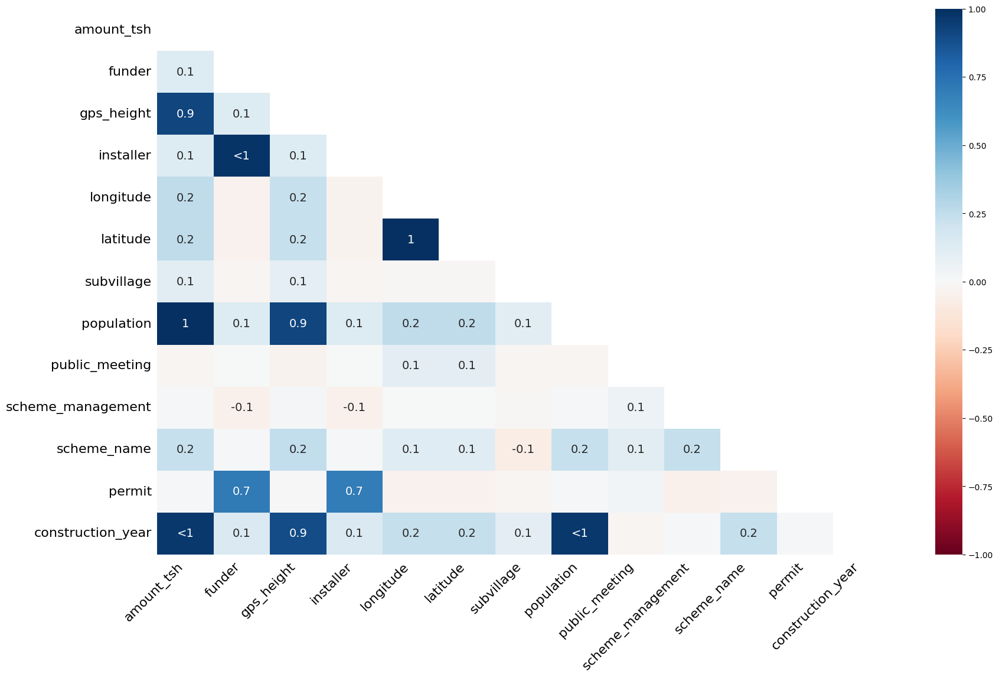

In [139]:
plot = msno.heatmap(predictores.drop(columns=['amount_tsh_log', 'population_log', 'prop_missings']))

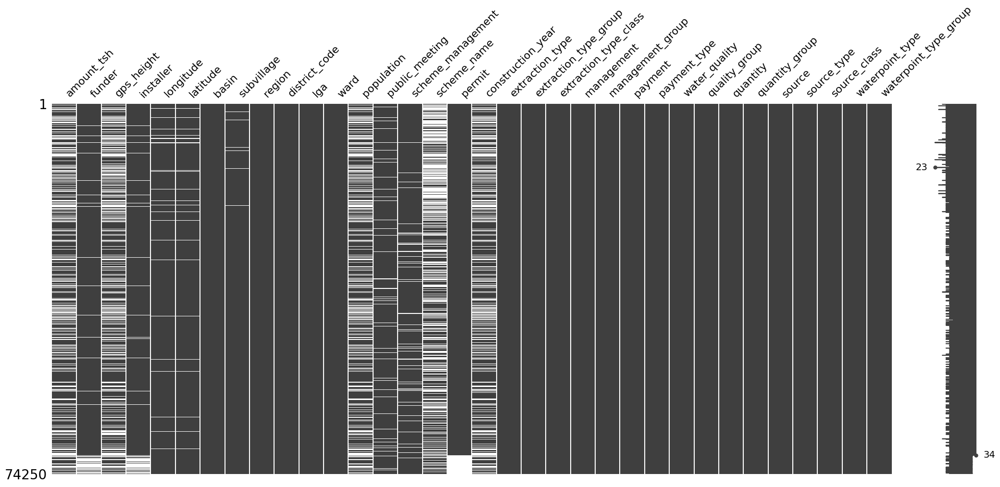

In [140]:
#hemos probado a ordenarlos por diversas variables para observar bien cómo se correlacionan los valores perdidos
plot=msno.matrix(predictores.drop(columns=['amount_tsh_log', 'population_log', 'prop_missings']).sort_values(by='permit'))

- Longitude y latitude (los generamos nosotros previamente)
- La correlación entre categóricas nos indica que no es buena idea imputar por la moda, puesto que es probable que haya un patrón detrás de dichos valores perdidos.
- En cuanto a las numéricas, trataremos de utilizar algoritmos de imputación para intentar restaurar los valores a partir del resto de observaciones sin valores perdidos.
- scheme_name tiene muchos perdidos, pero la importancia que tiene frente a la variable objetivo nos dice que mejor no eliminarla.

### Categóricas

In [141]:
predictores.select_dtypes(exclude=np.number).isna().sum().sort_values(ascending=False).head(7) / len(predictores) *100

scheme_name          47.485522
scheme_management     6.526599
installer             6.103704
funder                6.065993
public_meeting        5.595960
permit                5.108418
subvillage            0.632997
dtype: float64

In [142]:
predictores.scheme_name.value_counts(normalize=True)

K                       0.022005
None                    0.020363
Borehole                0.018055
Chalinze wate           0.012849
M                       0.012567
                          ...   
Mtunduru                0.000026
Jaduwaso                0.000026
LAMP water Supplying    0.000026
Njinjo water supply     0.000026
MIGA                    0.000026
Name: scheme_name, Length: 2868, dtype: float64

In [143]:
predictores.scheme_management.value_counts(normalize=True)

VWC                 0.661590
WUG                 0.093597
Water authority     0.057273
WUA                 0.051164
Water Board         0.049882
Parastatal          0.030603
Company             0.019322
Private operator    0.019106
Other               0.014351
SWC                 0.001772
Trust               0.001326
None                0.000014
Name: scheme_management, dtype: float64

In [144]:
predictores.funder.value_counts(normalize=True).head(10)

Government Of Tanzania    0.162002
Danida                    0.056018
Hesawa                    0.039888
Rwssp                     0.024417
World Bank                0.024388
Kkkt                      0.023270
World Vision              0.022396
Unicef                    0.018983
Tasaf                     0.016288
Dhv                       0.015270
Name: funder, dtype: float64

In [145]:
predictores.installer.value_counts(normalize=True).head(10)

DWE           0.311985
Government    0.032732
RWE           0.021487
Commu         0.019321
DANIDA        0.018718
KKKT          0.016065
Hesawa        0.015348
0             0.014057
TCRS          0.012723
CES           0.010973
Name: installer, dtype: float64

In [146]:
predictores.public_meeting.value_counts(normalize=True).head(10)

True     0.909466
False    0.090534
Name: public_meeting, dtype: float64

In [147]:
predictores.permit.value_counts(normalize=True).head(10)

True     0.689868
False    0.310132
Name: permit, dtype: float64

Crearemos una nueva clase con los valores perdidos puesto que no parece que podamos rellenar los valores perdidos a partir de otras variables.

In [148]:
predictores.scheme_name = predictores.scheme_name.fillna('Unknown')
predictores.scheme_management = predictores.scheme_management.fillna('Unknown')
predictores.installer = predictores.installer.fillna('Unknown')
predictores.funder = predictores.funder.fillna('Unknown')
predictores.public_meeting = predictores.public_meeting.fillna('Unknown')
predictores.permit = predictores.permit.fillna('Unknown')

Trataremos de rellenar la información faltante de las variables geográficas a partir de la información que nos proporciona el resto.

In [149]:
vista = predictores[['longitude', 'latitude', 'region', 'subvillage', 'district_code', 'lga', 'ward', 'basin']]

vista.sort_values(by=['district_code', 'lga', 'ward', 'basin', 'region']).tail(10)

,longitude,latitude,region,subvillage,district_code,lga,ward,basin
id,,,,,,,,
38036,34.096322,-3.946261,Shinyanga,Buzinza,80,Kishapu,Masanga,Internal
71337,34.097803,-3.948488,Shinyanga,Buzinza,80,Kishapu,Masanga,Internal
2510,34.014346,-3.956308,Shinyanga,Isemelo,80,Kishapu,Masanga,Internal
18435,34.008816,-3.960595,Shinyanga,Dodoma,80,Kishapu,Masanga,Internal
63060,34.009985,-3.954908,Shinyanga,Isemelo,80,Kishapu,Masanga,Internal
39959,34.102593,-3.951671,Shinyanga,Timbwe,80,Kishapu,Masanga,Internal
38236,34.006561,-3.969176,Shinyanga,Dodoma,80,Kishapu,Masanga,Internal
19608,34.007546,-3.952260,Shinyanga,Isemelo,80,Kishapu,Masanga,Internal
21180,34.019720,-3.904369,Shinyanga,Munge,80,Kishapu,Masanga,Internal


In [150]:
cols = ['region', 'subvillage', 'district_code', 'lga', 'ward', 'basin']

for col in cols:
    print(col, predictores[col].nunique())

region 21
subvillage 21425
district_code 20
lga 125
ward 2098
basin 9


In [151]:
vista[vista.subvillage.isna()].longitude.isna().sum()

0

In [152]:
vista[vista.subvillage.isna()].latitude.isna().sum()

0

Parece ser que ahí donde subvillage tiene valores perdidos, latitud y longitud no, por lo tanto podríamos tratar de rellenar la información a partir de estas dos variables principalmente.

In [153]:
vista.sort_values(by='subvillage').tail(10)

,longitude,latitude,region,subvillage,district_code,lga,ward,basin
id,,,,,,,,
15388,36.827965,-6.310269,Dodoma,NaN,3,Kongwa,Mlali,Wami / Ruvu
70675,36.643960,-6.069606,Dodoma,NaN,3,Kongwa,Kibaigwa,Wami / Ruvu
17416,36.659797,-6.269507,Dodoma,NaN,3,Kongwa,Iduo,Wami / Ruvu
70214,36.624861,-6.357358,Dodoma,NaN,3,Kongwa,Chamkoroma,Wami / Ruvu
9890,36.572800,-6.244027,Dodoma,NaN,3,Kongwa,Sagara,Wami / Ruvu
67658,36.481201,-5.716899,Dodoma,NaN,3,Kongwa,Mkoka,Wami / Ruvu
9207,36.709281,-6.031253,Dodoma,NaN,3,Kongwa,Njoge,Wami / Ruvu
61837,36.642242,-6.249101,Dodoma,NaN,3,Kongwa,Iduo,Wami / Ruvu
23718,36.704039,-6.023288,Dodoma,NaN,3,Kongwa,Njoge,Wami / Ruvu


Para tratar de recuperar los valores perdidos en subvillage, ordenaremos el data set a partir de latitud y longitud, y utilizaremos el método forward fill. Para latitud y longitud, ordenaremos el set de datos de acuerdo a las variables geográficas (primero con base en las de mayor granularidad) e interpolaremos.

In [154]:
predictores.sort_index(inplace=True)

In [155]:
predictores.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,subvillage,region,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,amount_tsh_log,population_log,prop_missings
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,NaN,Tasaf,NaN,TASAF,33.125828,-5.118154,Lake Tanganyika,Majengo,Tabora,3,Uyui,Igalula,NaN,Unknown,VWC,Unknown,True,NaN,afridev,afridev,handpump,vwc,user-group,unknown,unknown,milky,milky,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,NaN,17.647059
1,0.0,Shipo,1978.0,SHIPO,34.770717,-9.395642,Rufiji,Magoda C,Iringa,4,Njombe,Uwemba,20.0,True,Unknown,Unknown,False,2008.0,other - rope pump,rope pump,rope pump,vwc,user-group,never pay,never pay,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,0.000000,3.044522,5.882353
2,NaN,Lvia,NaN,LVIA,36.115056,-6.279268,Wami / Ruvu,Songambele,Dodoma,4,Chamwino,Msamalo,NaN,True,VWC,Mgun,True,NaN,mono,mono,motorpump,vwc,user-group,pay per bucket,per bucket,soft,good,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,NaN,NaN,11.764706
3,10.0,Germany Republi,1639.0,CES,37.147432,-3.187555,Pangani,Urereni,Kilimanjaro,5,Hai,Masama Magharibi,25.0,True,Water Board,Losaa-Kia water supply,True,1999.0,gravity,gravity,gravity,water board,user-group,pay per bucket,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,2.397895,3.258097,0.000000
4,NaN,Cmsr,NaN,CMSR,36.164893,-6.099289,Wami / Ruvu,Maata A,Dodoma,4,Chamwino,Majeleko,NaN,True,VWC,Unknown,True,NaN,nira/tanira,nira/tanira,handpump,vwc,user-group,unknown,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,NaN,14.705882


In [156]:
#rellenamos los datos faltantes de subvillage
predictores.subvillage = predictores.sort_values(by=['longitude', 'latitude', 'ward', 'lga', 'district_code', 'basin'], ascending=True).subvillage.fillna(method='ffill').sort_index()

In [157]:
#interpolamos los datos faltantes de longitude y latitude ordenando los datos por el resto de variables geográficas
predictores.longitude = predictores.sort_values(by=['subvillage', 'ward', 'lga', 'district_code', 'basin'], ascending=True).longitude.interpolate(method='linear').sort_index()
predictores.latitude = predictores.sort_values(by=['subvillage', 'ward', 'lga', 'district_code', 'basin'], ascending=True).latitude.interpolate(method='linear').sort_index()

Text(0.5, 1.0, 'Before interpolation')

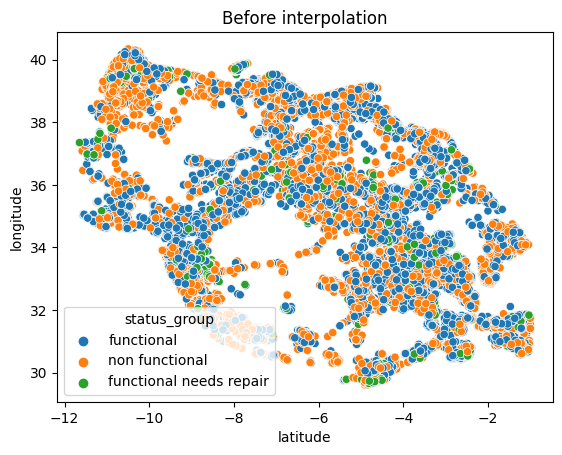

In [158]:
plot= sns.scatterplot(x=data.latitude, y=data.longitude, hue=data.status_group)
plt.title('Before interpolation')

Text(0.5, 1.0, 'After interpolation')

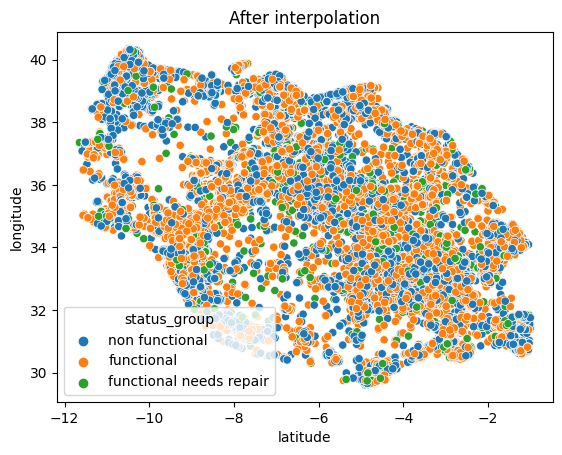

In [159]:
plot= sns.scatterplot(x=predictores.latitude, y=predictores.longitude, hue=varObj.sort_index())
plt.title('After interpolation')

# Codificación

Antes de tratar los valores numéricos perdidos, codificaremos las variables categóricas para que sean útiles para métodos de imputación multivariante.

In [160]:
for column in predictores.select_dtypes(exclude=np.number).columns.to_list():
    print(column, predictores[column].nunique())

funder 2140
installer 2410
basin 9
subvillage 21425
region 21
district_code 20
lga 125
ward 2098
public_meeting 3
scheme_management 13
scheme_name 2869
permit 3
extraction_type 18
extraction_type_group 13
extraction_type_class 7
management 12
management_group 5
payment 7
payment_type 7
water_quality 8
quality_group 6
quantity 5
quantity_group 5
source 10
source_type 7
source_class 3
waterpoint_type 7
waterpoint_type_group 6


Proponemos codificar por frecuencia.

In [161]:
encoder = ce.CountEncoder(normalize=True)
freq_enc = encoder.fit_transform(predictores.select_dtypes(exclude=np.number))

Antes de codificar, observaremos el número de clases que nos quedarían después de la codificación por frecuencia. En caso de que se pierda mucha información, consideraríamos otros tipos de codificación para determinadas variables.

In [162]:
frec_cols = [] #lista con las columnas que sí codificaremos por frecuencia
other_cols = [] #lista que debemos revisar

print('Número de categorías antes y después de la codificación:\n')

for column in freq_enc.columns.to_list():
    print(column, predictores[column].nunique(), '-->', freq_enc[column].nunique())
    if predictores[column].nunique() == freq_enc[column].nunique():
        frec_cols.append(column)
    else:
        other_cols.append(column)

Número de categorías antes y después de la codificación:

funder 2140 --> 171
installer 2410 --> 168
basin 9 --> 9
subvillage 21425 --> 109
region 21 --> 21
district_code 20 --> 20
lga 125 --> 120
ward 2098 --> 156
public_meeting 3 --> 3
scheme_management 13 --> 13
scheme_name 2869 --> 129
permit 3 --> 3
extraction_type 18 --> 18
extraction_type_group 13 --> 13
extraction_type_class 7 --> 7
management 12 --> 12
management_group 5 --> 5
payment 7 --> 7
payment_type 7 --> 7
water_quality 8 --> 8
quality_group 6 --> 6
quantity 5 --> 5
quantity_group 5 --> 5
source 10 --> 10
source_type 7 --> 7
source_class 3 --> 3
waterpoint_type 7 --> 7
waterpoint_type_group 6 --> 6


In [163]:
other_cols

['funder', 'installer', 'subvillage', 'lga', 'ward', 'scheme_name']

Para 'lga' pensamos que como solo se pierden 5 categorías podemos seguir adelante con la codificación por frecuencia. Para el resto, aplicaremos label encoding.

In [164]:
other_cols.remove('lga')
frec_cols.append('lga')

In [165]:
encoder = ce.CountEncoder(normalize=True, cols=frec_cols)
predictores = encoder.fit_transform(predictores)

In [166]:
le = preprocessing.LabelEncoder()

for column in other_cols:
    predictores[column] = le.fit_transform(predictores[column])

In [167]:
encoding_map = {'functional': 0, 'functional needs repair': 1, 'non functional': 2}

varObj_enc = varObj.map(encoding_map)

## Numéricas

In [168]:
(predictores.select_dtypes(include=np.number).isna().sum() / len(predictores)*100).sort_values(ascending=False).head(6)

gps_height           37.077441
construction_year    34.975084
amount_tsh           33.237710
population           33.237710
population_log       33.237710
amount_tsh_log       33.237710
dtype: float64

Probamos tres métodos, knn imputer, iterative imputer y random imputer. Tras realizar diversas pruebas, lo que mejores resultados nos ha dado ha sido imputar con iterative imputer con algún tuneo de parámetros y mezclar el set de datos con alguna columna de random imputer.

In [169]:
#imputer_knn = skl_imp.KNNImputer(n_neighbors=3)
#imputer_itImp = skl_imp.IterativeImputer(random_state=0)
imputer_itImp = skl_imp.IterativeImputer(random_state=0, max_iter=20, n_nearest_features=10)
imputer_rand = fe_imp.RandomSampleImputer(random_state=0)

In [134]:
#este método de imputación es costoso
#predictores_knn_imputed = pd.DataFrame(imputer_knn.fit_transform(predictores),columns=predictores.columns)


In [170]:
predictores_itImp_imputed = pd.DataFrame(imputer_itImp.fit_transform(predictores),columns=predictores.columns)

In [171]:
predictores_rand_imputed = imputer_rand.fit(predictores).transform(predictores)

Después del primer intento, revisamos los estadísticos de las imputaciones y lo comparamos al data set original para analizar mejor el tipo de dato que se estaba generando

In [172]:
df[['construction_year', 'gps_height', 'amount_tsh', 'population']].describe()

,construction_year,gps_height,amount_tsh,population
count,74250.000000,74250.000000,74250.000000,74250.000000
mean,1298.463650,665.667313,318.685704,180.750828
std,952.349375,692.761033,2906.762364,471.086120
min,0.000000,-90.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,1986.000000,364.000000,0.000000,25.000000
75%,2004.000000,1317.000000,20.000000,215.000000
max,2013.000000,2777.000000,350000.000000,30500.000000


In [179]:
#predictores_knn_imputed[['construction_year', 'gps_height', 'amount_tsh', 'amount_tsh_log', 'population', 'population_log']].describe()

,construction_year,gps_height,amount_tsh_log,population_log
count,74250.000000,74250.000000,74250.000000,74250.000000
mean,1996.994065,1057.214810,2.275101,4.251650
std,11.424153,545.897806,2.706467,2.034972
min,1960.000000,1.000000,0.000000,0.000000
25%,1990.000000,609.750000,0.000000,3.309426
50%,2000.000000,1164.000000,1.014841,4.875197
75%,2007.000000,1466.000000,4.144404,5.707110
max,2013.000000,2777.000000,12.765691,10.325515


In [175]:
predictores_itImp_imputed[['construction_year', 'gps_height', 'amount_tsh', 'amount_tsh_log', 'population', 'population_log']].describe()

,construction_year,gps_height,amount_tsh,amount_tsh_log,population,population_log
count,74250.000000,74250.000000,74250.000000,74250.000000,74250.000000,74250.000000
mean,1996.556359,1128.540958,416.988572,1.634017,306.002072,4.284546
std,10.146220,523.562740,2919.326016,2.878176,459.499924,1.801863
min,1960.000000,1.000000,-819.931816,-3.537718,0.000000,0.000000
25%,1993.000000,775.129091,0.000000,0.000000,75.000000,3.931826
50%,1997.000000,1270.287832,0.000000,0.000000,250.000000,4.615121
75%,2004.000000,1508.637248,500.000000,3.585135,419.021599,5.442418
max,2013.000000,2777.000000,350000.000000,12.765691,30500.000000,10.325515


In [176]:
predictores_rand_imputed[['construction_year', 'gps_height', 'amount_tsh', 'amount_tsh_log', 'population',  'population_log']].describe()

,construction_year,gps_height,amount_tsh,amount_tsh_log,population,population_log
count,74250.000000,74250.000000,74250.000000,74250.000000,74250.000000,74250.000000
mean,1996.910909,1060.582276,470.321564,2.381069,271.563987,4.216999
std,12.436091,587.632970,3372.585628,2.923598,552.895558,2.176469
min,1960.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1988.000000,471.000000,0.000000,0.000000,25.000000,3.258097
50%,2000.000000,1194.000000,0.000000,0.000000,150.000000,5.017280
75%,2008.000000,1511.000000,200.000000,5.303305,306.000000,5.726848
max,2013.000000,2777.000000,350000.000000,12.765691,30500.000000,10.325515


Tras el primer intento, observamos que el que mejores resultados estaba dandonos era Iterative Imputer, pero al mismo tiempo estaba produciendo valores inválidos en amount_tsh y population, incluso después de corregir el error en gps_height en la depuración. Tras ajustar los hiperparámetros, logramos que dejara de producir valores inválidos en population, pero no en amount_tsh. Por tanto, hemos decidido mantener Iterative Imputer pero sustituyendo la mencionada variable por random imputer.

In [177]:
predictores_itImp_imputed.loc[:,['amount_tsh', 'amount_tsh_log']] = predictores_rand_imputed.loc[:,['amount_tsh', 'amount_tsh_log']]

# Modelización

In [178]:
#data_knn = predictores_knn_imputed.join(varObj_enc)
data_itImp = predictores_itImp_imputed.join(varObj_enc)
#data_rand = predictores_rand_imputed.join(varObj_enc)

test_itImp = data_itImp.iloc[indices_test].drop(columns='status_group')
data_itImp.drop(index=indices_test, inplace=True)

## Primer intento

Antes que nada, vamos a realizar pruebas con los tres data sets que hemos generado para tratar de averiguar cuál podría funcionar mejor.

In [42]:
# test_knn = data_knn.iloc[indices_test].drop(columns='status_group')
# data_knn.drop(index=indices_test, inplace=True)

# test_itImp = data_itImp.iloc[indices_test].drop(columns='status_group')
# data_itImp.drop(index=indices_test, inplace=True)

# test_rand = data_rand.iloc[indices_test].drop(columns='status_group')
# data_rand.drop(index=indices_test, inplace=True)


In [179]:
#pequeña función que nos da toda la información que queremos directamente en una celda

def probar_data_rf(data, y_col_name):
    X_train, X_test, y_train, y_test = train_test_split(data.drop(y_col_name,axis=1),
                                                        data[y_col_name],
                                                        test_size=0.2,
                                                        random_state=42,
                                                        stratify = data[y_col_name])

    model = RandomForestClassifier(random_state=42)
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)

    print(saca_metricas(y_test, y_pred, y_proba))
    print(classification_report(y_test, y_pred))

    feat_importances = pd.DataFrame(model.feature_importances_, index=X_train.columns, columns=["Importance"])
    feat_importances.sort_values(by='Importance', ascending=True, inplace=True)
    plot = feat_importances.plot(kind='barh', figsize=(8,6))
    plt.show()
    return model

matriz de confusión
[[5712  186  554]
 [ 467  280  116]
 [ 980   66 3519]]
accuracy
0.8005892255892256
precision
0.7943580111074096
recall
0.8005892255892256
f1
0.7939296814100146
ROC-AUC OvR: 
0.887059414067655
ROC-AUC OvO: 
0.8719831712655962
None
              precision    recall  f1-score   support

         0.0       0.80      0.89      0.84      6452
         1.0       0.53      0.32      0.40       863
         2.0       0.84      0.77      0.80      4565

    accuracy                           0.80     11880
   macro avg       0.72      0.66      0.68     11880
weighted avg       0.79      0.80      0.79     11880



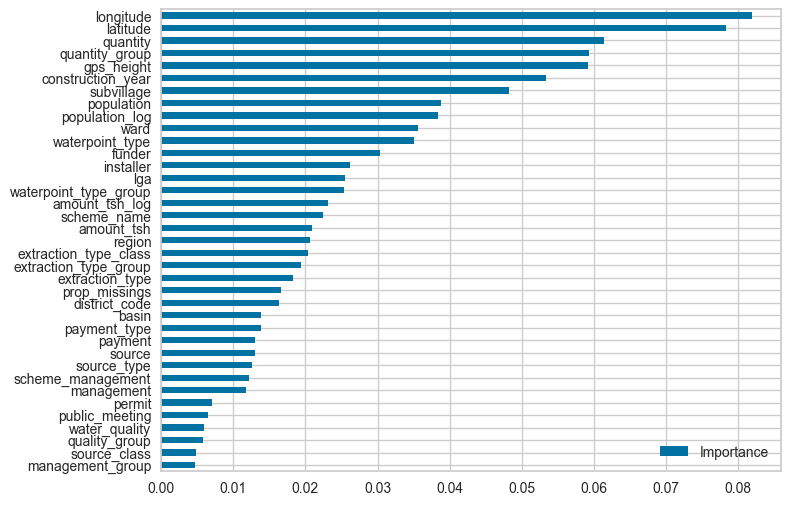

In [44]:
#dataknn_model = probar_data_rf(data_knn, 'status_group')

matriz de confusión
[[5711  181  560]
 [ 462  270  131]
 [ 964   54 3547]]
accuracy
0.802020202020202
precision
0.795029854852595
recall
0.802020202020202
f1
0.7948260769433794
ROC-AUC OvR: 
0.891669836094342
ROC-AUC OvO: 
0.8772409294846021
None
              precision    recall  f1-score   support

         0.0       0.80      0.89      0.84      6452
         1.0       0.53      0.31      0.39       863
         2.0       0.84      0.78      0.81      4565

    accuracy                           0.80     11880
   macro avg       0.72      0.66      0.68     11880
weighted avg       0.80      0.80      0.79     11880



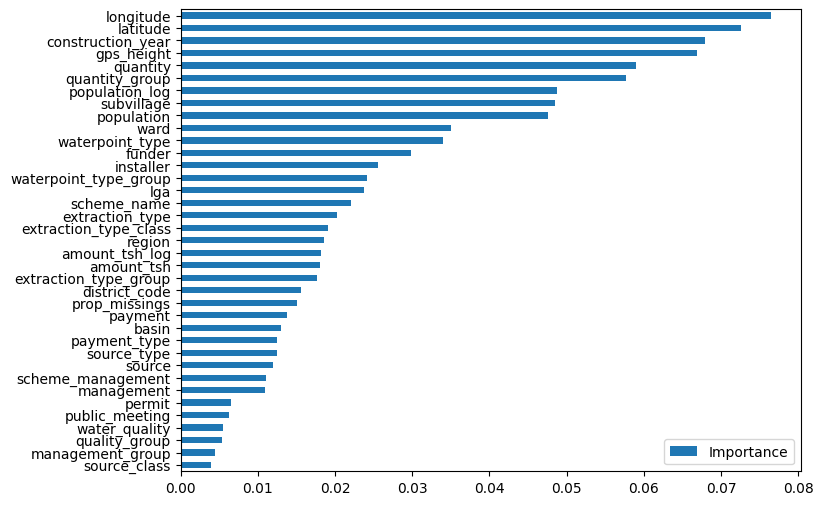

In [180]:
data_itImp_model = probar_data_rf(data_itImp, 'status_group')

In [182]:
#data_rand_model = probar_data_rf(data_rand, 'status_group')

In [183]:
def cross_validation(model, data, y_name):
    results = cross_val_score(estimator=model, X=data.drop(columns=y_name), y=data[y_name], cv=5, scoring='accuracy')
    print(results.mean())
    print(results.std())
    return results

In [129]:
#cross_validation(dataknn_model, data_knn, 'status_group')

0.8054545454545454
0.002727792277070235


array([0.80993266, 0.80429293, 0.80555556, 0.80597643, 0.80151515])

In [184]:
cross_validation(data_itImp_model, data_itImp, 'status_group')

0.8071380471380472
0.001688041018195947


array([0.81001684, 0.80656566, 0.80639731, 0.80496633, 0.80774411])

In [131]:
#cross_validation(data_rand_model, data_rand, 'status_group')

0.8049831649831651
0.002864130682577351


array([0.80892256, 0.80597643, 0.80547138, 0.80008418, 0.80446128])

El modelo que mejores resultados parece estar dando es el que utiliza los datos imputados por Iterative Imputer. Probaremos a lanzar un primer intento con este modelo sencillo.

## Predicción 1

In [48]:
model1 = RandomForestClassifier(random_state=42).fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])
y_pred = model1.predict(test_itImp)

In [49]:
primera_pred = pd.DataFrame(data= zip(indices_test, y_pred), columns=['id', 'status_group'])

In [54]:
reverse_map = {v: k for k, v in encoding_map.items()}
primera_pred.status_group = primera_pred.status_group.map(reverse_map)

In [58]:
primera_pred.to_csv('primer_intento.csv', index=False)

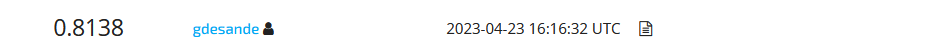

Después de realizar el primer intento, nos dimos cuenta de que había valores inválidos en los data sets finales que estábamos utilizando, así que volvimos atrás a la depuración para tratar de corregir dichos errores.

In [62]:
# df[['construction_year', 'gps_height', 'amount_tsh', 'population']].describe()

,construction_year,gps_height,amount_tsh,population
count,74250.000000,74250.000000,74250.000000,74250.000000
mean,1298.463650,665.667313,318.685704,180.750828
std,952.349375,692.761033,2906.762364,471.086120
min,0.000000,-90.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,1986.000000,364.000000,0.000000,25.000000
75%,2004.000000,1317.000000,20.000000,215.000000
max,2013.000000,2777.000000,350000.000000,30500.000000


In [63]:
# predictores_itImp_imputed[['construction_year', 'gps_height', 'amount_tsh', 'population']].describe()

,construction_year,gps_height,amount_tsh,population
count,74250.000000,74250.000000,74250.000000,74250.000000
mean,1996.562361,1170.678172,330.475062,263.281452
std,10.353393,574.726781,2921.314694,460.394837
min,1960.000000,-161.658790,-1296.330495,-165.845545
25%,1991.645120,826.828955,0.000000,50.000000
50%,1997.546832,1316.000000,0.000000,200.000000
75%,2004.741148,1572.150455,268.962339,329.532805
max,2013.000000,2777.000000,350000.000000,30500.000000


In [64]:
#predictores_knn_imputed[['construction_year', 'gps_height', 'amount_tsh', 'population']].describe()

,construction_year,gps_height,amount_tsh,population
count,74250.000000,74250.000000,74250.000000,74250.000000
mean,1997.000485,1025.397571,457.859469,285.626958
std,11.423213,568.469559,3029.595778,520.030751
min,1960.000000,-90.000000,0.000000,0.000000
25%,1990.000000,515.000000,0.000000,50.000000
50%,2000.000000,1142.333333,5.000000,170.000000
75%,2007.000000,1456.000000,200.000000,350.000000
max,2013.000000,2777.000000,350000.000000,30500.000000


In [65]:
#predictores_rand_imputed[['construction_year', 'gps_height', 'amount_tsh', 'population']].describe()

,construction_year,gps_height,amount_tsh,population
count,74250.000000,74250.000000,74250.000000,74250.000000
mean,1996.910909,1017.305481,470.321564,271.563987
std,12.436091,612.184317,3372.585628,552.895558
min,1960.000000,-90.000000,0.000000,0.000000
25%,1988.000000,391.000000,0.000000,25.000000
50%,2000.000000,1167.000000,0.000000,150.000000
75%,2008.000000,1495.000000,200.000000,306.000000
max,2013.000000,2777.000000,350000.000000,30500.000000


## Segundo intento

matriz de confusión
[[5711  181  560]
 [ 462  270  131]
 [ 964   54 3547]]
accuracy
0.802020202020202
precision
0.795029854852595
recall
0.802020202020202
f1
0.7948260769433794
ROC-AUC OvR: 
0.891669836094342
ROC-AUC OvO: 
0.8772409294846021
None
              precision    recall  f1-score   support

         0.0       0.80      0.89      0.84      6452
         1.0       0.53      0.31      0.39       863
         2.0       0.84      0.78      0.81      4565

    accuracy                           0.80     11880
   macro avg       0.72      0.66      0.68     11880
weighted avg       0.80      0.80      0.79     11880



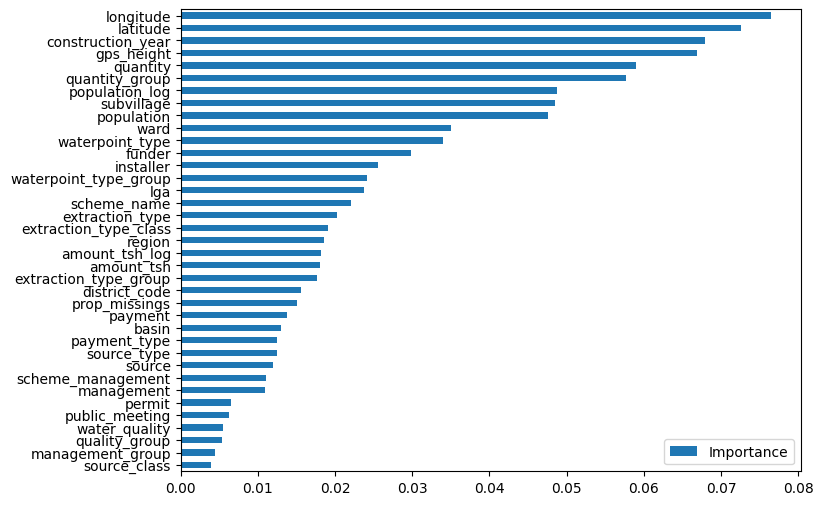

In [185]:
#probamos el data set después de las correcciones en la limpieza

#data_itImp_model = probar_data_rf(data_itImp, 'status_group')

In [186]:
#cross_validation(data_itImp_model, data_itImp, 'status_group')

0.8071380471380472
0.001688041018195947


array([0.81001684, 0.80656566, 0.80639731, 0.80496633, 0.80774411])

Vamos a tratar de ir mejorando el modelo.

In [187]:
#eliminamos las variables población y amount_tsh, dejaremos las transformaciones logarítmicas pues son más significativas
#eliminamos también prop_missings, pues por suerte no tiene un gran impacto sobre el modelo
predictores_itImp_imputed.drop(columns=['amount_tsh', 'population', 'prop_missings'], inplace=True)

In [188]:
#también eliminamos las variables que presentaban gran desbalanceo y que efectivamente han tenido muy poca importancia en el modelo
predictores_itImp_imputed.drop(columns=['public_meeting', 'management_group', 'water_quality', 'quality_group'], inplace=True)

### Tramificación

Primero, trataremos de tramificar las variables numéricas para ver si logramos mejoras.

In [35]:
# data_itImp = predictores_itImp_imputed.join(varObj_enc)

# test_itImp = data_itImp.iloc[indices_test].drop(columns='status_group')
# data_itImp.drop(index=indices_test, inplace=True)

In [189]:
# binning = MulticlassOptimalBinning(name='amount_tsh_log')

# binning.fit(data_itImp['amount_tsh_log'], data_itImp['status_group'])
# binning_table = binning.binning_table
# binning_table.build()

,Bin,Count,Count (%),Event_0.0,Event_1.0,Event_2.0,Event_rate_0.0,Event_rate_1.0,Event_rate_2.0
0,"(-inf, 0.90)",32786,0.551953,15190,2300,15296,0.463308,0.070152,0.466541
1,"[0.90, 5.79)",14681,0.247155,9212,1051,4418,0.627478,0.071589,0.300933
2,"[5.79, inf)",11933,0.200892,7857,966,3110,0.658426,0.080952,0.260622
3,Special,0,0.000000,0,0,0,0.000000,0.000000,0.000000
4,Missing,0,0.000000,0,0,0,0.000000,0.000000,0.000000
Totals,,59400,1.000000,32259,4317,22824,0.543081,0.072677,0.384242


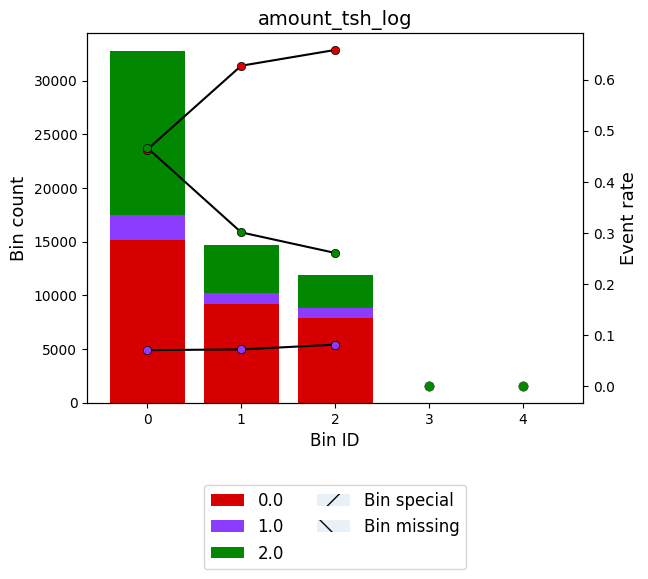

In [190]:
# binning_table.plot()

Amount_tsh podría verse beneficiada por la tramificación, así que la transformaremos por el Weight of Evidence ponderado de cada clase

In [191]:
# predictores_itImp_imputed['amount_tsh_binned'] = binning.transform(predictores_itImp_imputed.amount_tsh_log, metric="weighted_mean_woe")

In [192]:
# predictores_itImp_imputed['amount_tsh_binned'].value_counts(normalize=True)

 0.046739    0.551380
-0.045508    0.247448
-0.051625    0.201172
Name: amount_tsh_binned, dtype: float64

In [193]:
# binning = MulticlassOptimalBinning(name='gps_height')

# binning.fit(data_itImp['gps_height'], data_itImp['status_group'])
# binning_table = binning.binning_table
# binning_table.build()

,Bin,Count,Count (%),Event_0.0,Event_1.0,Event_2.0,Event_rate_0.0,Event_rate_1.0,Event_rate_2.0
0,"(-inf, 156.92)",3201,0.053889,1568,72,1561,0.489847,0.022493,0.487660
1,"[156.92, 853.01)",13370,0.225084,6454,792,6124,0.482723,0.059237,0.458040
2,"[853.01, 1239.59)",11198,0.188519,5386,1023,4789,0.480979,0.091356,0.427666
3,"[1239.59, 1579.63)",21313,0.358805,11912,1797,7604,0.558908,0.084315,0.356778
4,"[1579.63, 1811.03)",7346,0.123670,4724,523,2099,0.643071,0.071195,0.285734
5,"[1811.03, inf)",2972,0.050034,2215,110,647,0.745289,0.037012,0.217699
6,Special,0,0.000000,0,0,0,0.000000,0.000000,0.000000
7,Missing,0,0.000000,0,0,0,0.000000,0.000000,0.000000
Totals,,59400,1.000000,32259,4317,22824,0.543081,0.072677,0.384242


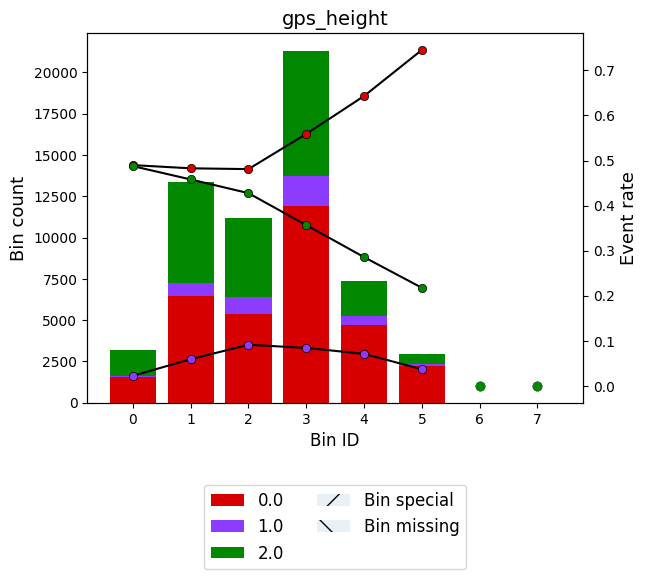

In [194]:
# binning_table.plot()

In [195]:
# predictores_itImp_imputed['gps_height_binned'] = binning.transform(predictores_itImp_imputed.gps_height, metric="weighted_mean_woe")
# predictores_itImp_imputed['gps_height_binned'].value_counts(normalize=True)

-0.001195    0.358155
 0.030713    0.226168
 0.047816    0.188431
-0.053451    0.123327
 0.042713    0.053966
-0.127180    0.049953
Name: gps_height_binned, dtype: float64

In [196]:
# binning = MulticlassOptimalBinning(name='longitude')

# binning.fit(data_itImp['longitude'], data_itImp['status_group'])
# binning_table = binning.binning_table
# binning_table.build()

,Bin,Count,Count (%),Event_0.0,Event_1.0,Event_2.0,Event_rate_0.0,Event_rate_1.0,Event_rate_2.0
0,"(-inf, 34.10)",22113,0.372273,10820,2143,9150,0.489305,0.096911,0.413784
1,"[34.10, 34.78)",5780,0.097306,3955,372,1453,0.684256,0.064360,0.251384
2,"[34.78, 38.50)",24372,0.410303,14265,1533,8574,0.585303,0.062900,0.351797
3,"[38.50, inf)",7135,0.120118,3219,269,3647,0.451156,0.037701,0.511142
4,Special,0,0.000000,0,0,0,0.000000,0.000000,0.000000
5,Missing,0,0.000000,0,0,0,0.000000,0.000000,0.000000
Totals,,59400,1.000000,32259,4317,22824,0.543081,0.072677,0.384242


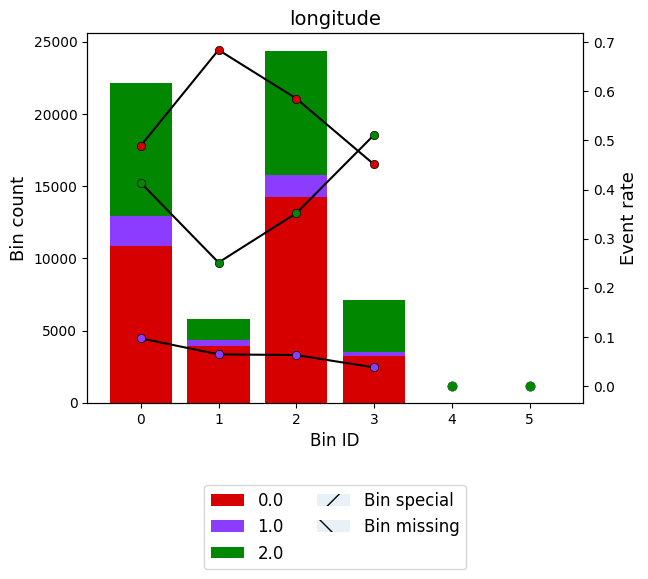

In [197]:
# binning_table.plot()

In [198]:
# predictores_itImp_imputed['longitude_binned'] = binning.transform(predictores_itImp_imputed.longitude, metric="weighted_mean_woe")
# predictores_itImp_imputed['longitude_binned'].value_counts(normalize=True)

-0.028426    0.409630
 0.046864    0.372997
 0.052323    0.120027
-0.078618    0.097347
Name: longitude_binned, dtype: float64

In [199]:
# binning = MulticlassOptimalBinning(name='latitude')

# binning.fit(data_itImp['latitude'], data_itImp['status_group'])
# binning_table = binning.binning_table
# binning_table.build()

,Bin,Count,Count (%),Event_0.0,Event_1.0,Event_2.0,Event_rate_0.0,Event_rate_1.0,Event_rate_2.0
0,"(-inf, -9.91)",5368,0.090370,2295,345,2728,0.427534,0.064270,0.508197
1,"[-9.91, -4.84)",26431,0.444966,14420,1610,10401,0.545571,0.060913,0.393515
2,"[-4.84, inf)",27601,0.464663,15544,2362,9695,0.563168,0.085577,0.351255
3,Special,0,0.000000,0,0,0,0.000000,0.000000,0.000000
4,Missing,0,0.000000,0,0,0,0.000000,0.000000,0.000000
Totals,,59400,1.000000,32259,4317,22824,0.543081,0.072677,0.384242


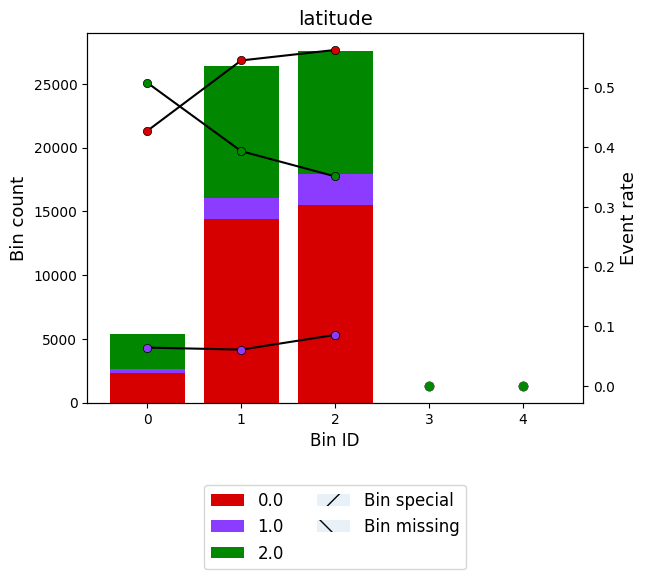

In [200]:
# binning_table.plot()

In [201]:
# predictores_itImp_imputed['latitude_binned'] = binning.transform(predictores_itImp_imputed.latitude, metric="weighted_mean_woe")
# predictores_itImp_imputed['latitude_binned'].value_counts(normalize=True)

-0.002492    0.464067
-0.006698    0.446343
 0.068145    0.089589
Name: latitude_binned, dtype: float64

In [202]:
# binning = MulticlassOptimalBinning(name='population_log')

# binning.fit(data_itImp['population_log'], data_itImp['status_group'])
# binning_table = binning.binning_table
# binning_table.build()

,Bin,Count,Count (%),Event_0.0,Event_1.0,Event_2.0,Event_rate_0.0,Event_rate_1.0,Event_rate_2.0
0,"(-inf, 0.90)",8738,0.147104,4165,388,4185,0.476654,0.044404,0.478943
1,"[0.90, inf)",50662,0.852896,28094,3929,18639,0.554538,0.077553,0.367909
2,Special,0,0.000000,0,0,0,0.000000,0.000000,0.000000
3,Missing,0,0.000000,0,0,0,0.000000,0.000000,0.000000
Totals,,59400,1.000000,32259,4317,22824,0.543081,0.072677,0.384242


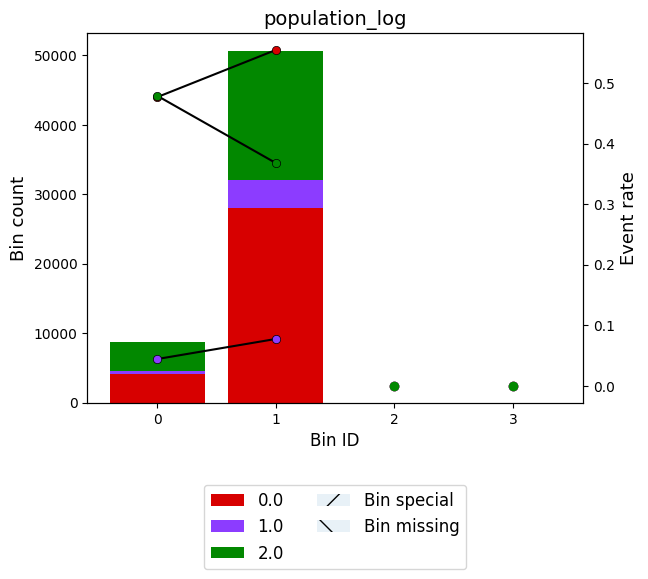

In [203]:
# binning_table.plot()

In [204]:
# predictores_itImp_imputed['population_binned'] = binning.transform(predictores_itImp_imputed.population_log, metric="weighted_mean_woe")
# predictores_itImp_imputed['population_binned'].value_counts(normalize=True)

-0.003482    0.8527
 0.033744    0.1473
Name: population_binned, dtype: float64

In [205]:
# binning = MulticlassOptimalBinning(name='construction_year')

# binning.fit(data_itImp['construction_year'], data_itImp['status_group'])
# binning_table = binning.binning_table
# binning_table.build()

,Bin,Count,Count (%),Event_0.0,Event_1.0,Event_2.0,Event_rate_0.0,Event_rate_1.0,Event_rate_2.0
0,"(-inf, 1977.50)",3715,0.062542,1095,281,2339,0.294751,0.075639,0.629610
1,"[1977.50, 1982.50)",3022,0.050875,1046,234,1742,0.346128,0.077432,0.576439
2,"[1982.50, 1994.80)",13832,0.232862,5541,1076,7215,0.400593,0.077791,0.521617
3,"[1994.80, 1996.37)",6626,0.111549,3621,567,2438,0.546484,0.085572,0.367944
4,"[1996.37, 1998.45)",7950,0.133838,4752,692,2506,0.597736,0.087044,0.315220
5,"[1998.45, 2006.02)",12346,0.207845,7703,866,3777,0.623927,0.070144,0.305929
6,"[2006.02, 2009.50)",6748,0.113603,4707,381,1660,0.697540,0.056461,0.245999
7,"[2009.50, inf)",5161,0.086886,3794,220,1147,0.735129,0.042627,0.222244
8,Special,0,0.000000,0,0,0,0.000000,0.000000,0.000000
9,Missing,0,0.000000,0,0,0,0.000000,0.000000,0.000000


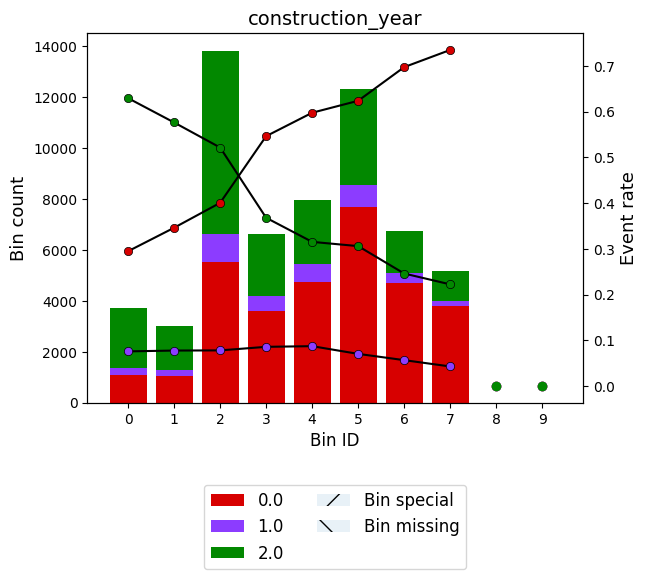

In [206]:
# binning_table.plot()

In [207]:
# predictores_itImp_imputed['construction_year_binned'] = binning.transform(predictores_itImp_imputed.construction_year, metric="weighted_mean_woe")
# predictores_itImp_imputed['construction_year_binned'].value_counts(normalize=True)

 0.092888    0.233374
-0.044762    0.207919
-0.018604    0.134343
-0.091201    0.113401
 0.006351    0.111771
-0.119352    0.087017
 0.179418    0.061886
 0.134678    0.050290
Name: construction_year_binned, dtype: float64

Ahora que tenemos las variables tramificadas, probaremos un modelo para observar cómo se comportan

matriz de confusión
[[5689  181  582]
 [ 461  274  128]
 [ 950   60 3555]]
accuracy
0.8011784511784512
precision
0.79410662649491
recall
0.8011784511784512
f1
0.794272151517108
ROC-AUC OvR: 
0.891625430549463
ROC-AUC OvO: 
0.8770041355967967
None
              precision    recall  f1-score   support

         0.0       0.80      0.88      0.84      6452
         1.0       0.53      0.32      0.40       863
         2.0       0.83      0.78      0.81      4565

    accuracy                           0.80     11880
   macro avg       0.72      0.66      0.68     11880
weighted avg       0.79      0.80      0.79     11880



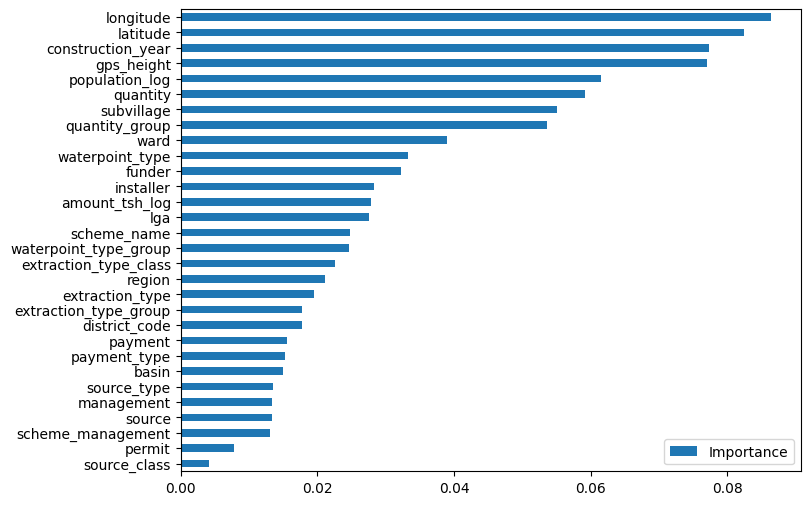

In [38]:
# data_itImp = predictores_itImp_imputed.join(varObj_enc)

# test_itImp = data_itImp.iloc[indices_test].drop(columns='status_group')
# data_itImp.drop(index=indices_test, inplace=True)

# data_itImp_model = probar_data_rf(data_itImp, 'status_group')

Al parecer las tramificaciones no mejoran el impacto de la variable en el modelo, así que las eliminaremos.

In [208]:
# predictores_itImp_imputed.drop(columns=['latitude_binned', 'population_binned', 'longitude_binned', 'gps_height_binned',
#                                         'amount_tsh_binned', 'construction_year_binned'], inplace=True)

Lanzaremos otra vez el modelo para asegurarnos también de que el modelo no ha perdido con la eliminación de variables previa.

matriz de confusión
[[5689  181  582]
 [ 461  274  128]
 [ 950   60 3555]]
accuracy
0.8011784511784512
precision
0.79410662649491
recall
0.8011784511784512
f1
0.794272151517108
ROC-AUC OvR: 
0.891625430549463
ROC-AUC OvO: 
0.8770041355967967
None
              precision    recall  f1-score   support

         0.0       0.80      0.88      0.84      6452
         1.0       0.53      0.32      0.40       863
         2.0       0.83      0.78      0.81      4565

    accuracy                           0.80     11880
   macro avg       0.72      0.66      0.68     11880
weighted avg       0.79      0.80      0.79     11880



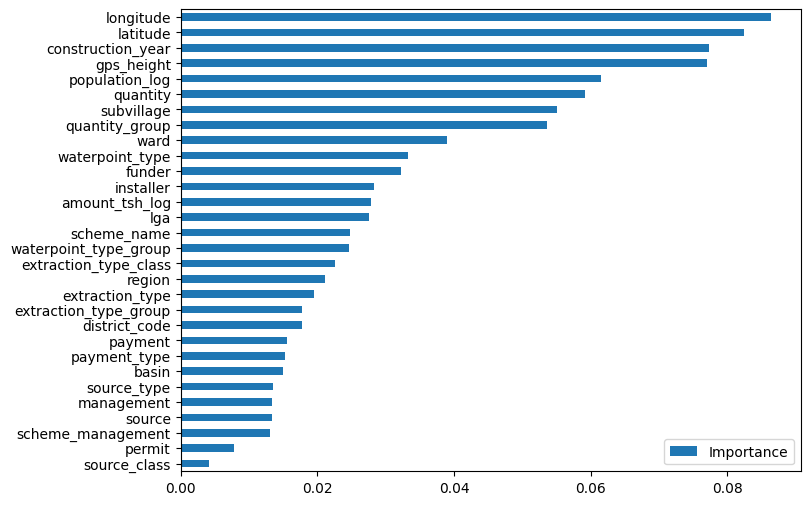

In [209]:
#data_knn = predictores_knn_imputed.join(varObj_enc)
data_itImp = predictores_itImp_imputed.join(varObj_enc)
#data_rand = predictores_rand_imputed.join(varObj_enc)

test_itImp = data_itImp.iloc[indices_test].drop(columns='status_group')
data_itImp.drop(index=indices_test, inplace=True)

data_itImp_model = probar_data_rf(data_itImp, 'status_group')

La performance del modelo es casi idéntica. Ha bajado ínfimamente (p. ej. precision .802 a 0.801), pero es normal al haber descartado variables.

## Resampling

Hemos podido comprobar que la clase 1 es la que más dificultades tiene el modelo para predecir, puesto que hay muy pocas muestras, así que hemos pensado que sería una gran idea remuestrear los datos para hacer el modelo más sensible a dicha categoría. Vamos a probar con remuestrear los datos mediante una combinación de SMOTE y under-sampling, y SMOTE solamente.

In [210]:
#NOTA: por alguna razón, a veces la función no hace todos los prints. De ser así, reejecutar hasta que se imprima correctamente.

def probar_sampling_method(data, y, sam_method):

    print('Before:')
    print(data[y].value_counts())
    print('='*50)
    print('Shape: ', data.shape)

    X_resampled, y_resampled = sam_method.fit_resample(data.drop(columns=y), data[y].ravel())
    X_resampled[y] = y_resampled

    print('='*50)
    print('After:')
    print(X_resampled[y].value_counts())
    print('='*50)
    print('Shape: ', X_resampled.shape)
    
    print('='*50)
    print('Modelo:')
    model = probar_data_rf(X_resampled, y)
    print('Cross_validation:')
    cross_validation(model, X_resampled, y)
    return X_resampled
    

In [213]:
data_itImp.status_group.value_counts(normalize=True)

0.0    0.543081
2.0    0.384242
1.0    0.072677
Name: status_group, dtype: float64

Before:
0.0    32259
2.0    22824
1.0     4317
Name: status_group, dtype: int64
Shape:  (59400, 31)
After:
1.0    23497
2.0    14931
0.0    12359
Name: status_group, dtype: int64
Shape:  (50787, 31)
Modelo:
matriz de confusión
[[2298   76   98]
 [  55 4575   70]
 [  96  274 2616]]
accuracy
0.9341405788541052
precision
0.9343750800053559
recall
0.9341405788541052
f1
0.9336852842023836
ROC-AUC OvR: 
0.991001835116907
ROC-AUC OvO: 
0.9906036137562905
None
              precision    recall  f1-score   support

         0.0       0.94      0.93      0.93      2472
         1.0       0.93      0.97      0.95      4700
         2.0       0.94      0.88      0.91      2986

    accuracy                           0.93     10158
   macro avg       0.94      0.93      0.93     10158
weighted avg       0.93      0.93      0.93     10158



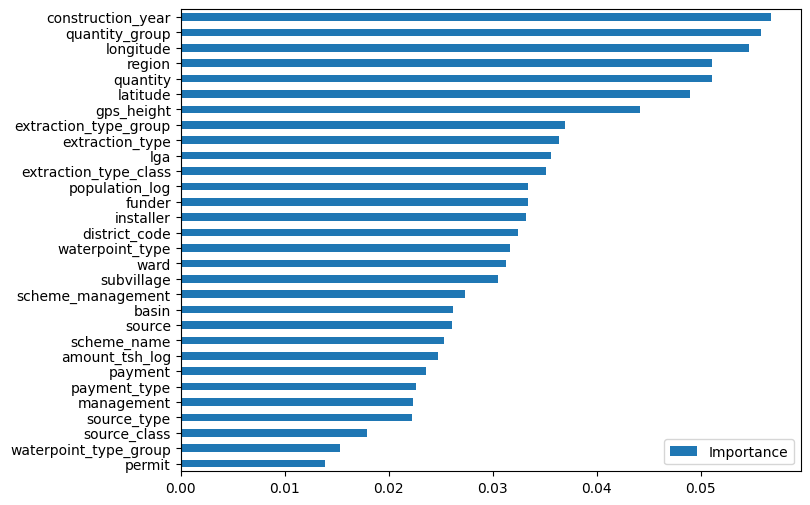

Cross_validation:
0.929095833725144
0.02638937895729858


In [215]:
smote_enn = SMOTEENN(random_state=0, n_jobs=-1)
data_res_enn = probar_sampling_method(data_itImp, 'status_group', smote_enn)

In [212]:
# smt = SMOTETomek(random_state=0)
# data_res_smt = probar_sampling_method(data_itImp, 'status_group', smt)

Before:
0.0    32259
2.0    22824
1.0     4317
Name: status_group, dtype: int64
Shape:  (59400, 31)
After:
0.0    32259
2.0    25000
1.0    15000
Name: status_group, dtype: int64
Shape:  (72259, 31)
Modelo:
matriz de confusión
[[5629  242  581]
 [ 423 2425  152]
 [ 935  244 3821]]
accuracy
0.8216855798505397
precision
0.8228852269338903
recall
0.8216855798505397
f1
0.8210487611051521
ROC-AUC OvR: 
0.9388277496257252
ROC-AUC OvO: 
0.9410567287008335
None
              precision    recall  f1-score   support

         0.0       0.81      0.87      0.84      6452
         1.0       0.83      0.81      0.82      3000
         2.0       0.84      0.76      0.80      5000

    accuracy                           0.82     14452
   macro avg       0.83      0.81      0.82     14452
weighted avg       0.82      0.82      0.82     14452



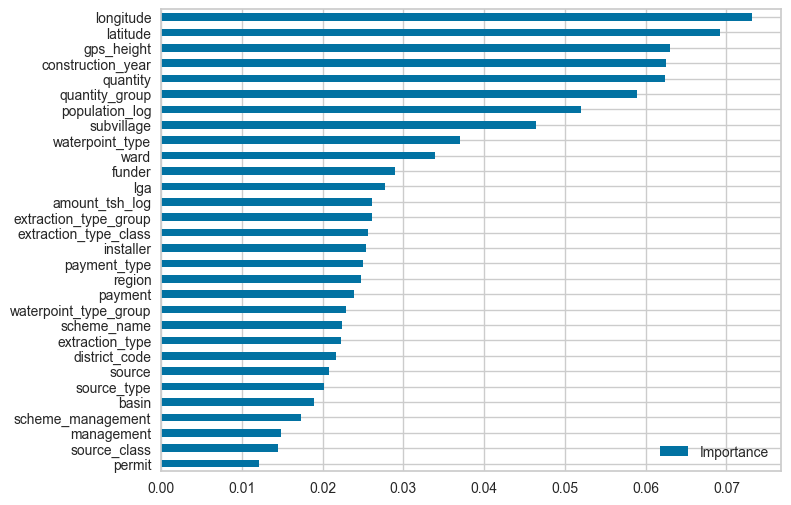

Cross_validation:
0.8209217782309605
0.037598418093855404


In [ ]:
# sm = SMOTE(random_state=2, n_jobs=-1, sampling_strategy={1.0: 15000, 2.0: 25000})
# data_res_sm = probar_sampling_method(data_itImp, 'status_group', sm)

El método que mejores resultados nos da es SMOTEEN, así que probaremos a lanzar una predicción con el modelo entrenado con este nuevo data set.

In [154]:
model2 = RandomForestClassifier(random_state=42).fit(data_res_enn.drop(columns='status_group'), data_res_enn['status_group'])
y_pred = model2.predict(test_itImp)

segunda_pred = pd.DataFrame(data= zip(indices_test, y_pred), columns=['id', 'status_group'])

reverse_map = {v: k for k, v in encoding_map.items()}
segunda_pred.status_group = segunda_pred.status_group.map(reverse_map)

segunda_pred.to_csv('segundo_intento.csv', index=False)

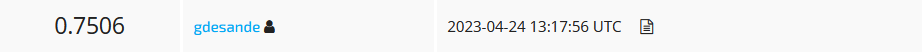

Por el resultado final, vemos que el modelo estaba overfitted como consecuencia del remuestreo. Tras realizar un poco de búsqueda en internet, nos damos cuenta de que hemos cometido el error de no hacer un train/test split antes del remuestreo, es por este motivo que los resultados obtenidos eran demasiado optimistas. A continuación, trataremos de repetir el proceso pero intentando evitar el overfitting.

# Tercer intento

## Resampling 2

In [37]:
def sampling_method_con_split(data, y, sam_method):
    
    X_train, X_test, y_train, y_test = train_test_split(data.drop(y,axis=1),
                                                        data[y],
                                                        test_size=0.2,
                                                        random_state=42,
                                                        stratify = data[y])


    print('Before:')
    print(y_train.value_counts())
    print('='*50)
    print('Shape: ', X_train.shape)

    X_resampled, y_resampled = sam_method.fit_resample(X_train, y_train.ravel())
    X_resampled[y] = y_resampled

    print('='*50)
    print('After:')
    print(X_resampled[y].value_counts())
    print('='*50)
    print('Shape: ', X_resampled.shape)
    
    print('='*50)
    print('Modelo:')
    model = RandomForestClassifier(random_state=42).fit(X_resampled.drop(columns=y), X_resampled[y])
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)

    print(saca_metricas(y_test, y_pred, y_proba))
    print(classification_report(y_test, y_pred))

    feat_importances = pd.DataFrame(model.feature_importances_, index=X_resampled.drop(columns=y).columns, columns=["Importance"])
    feat_importances.sort_values(by='Importance', ascending=True, inplace=True)
    plot = feat_importances.plot(kind='barh', figsize=(8,6))
    plt.show()

    X_test[y] = y_test
    data_res = pd.concat([X_resampled, X_test], axis=0)

    return data_res

Before:
0.0    25807
2.0    18259
1.0     3454
Name: status_group, dtype: int64
Shape:  (47520, 30)
After:
1.0    18774
2.0    11460
0.0     9334
Name: status_group, dtype: int64
Shape:  (39568, 31)
Modelo:
matriz de confusión
[[4507  829 1116]
 [ 235  493  135]
 [ 704  292 3569]]
accuracy
0.7212962962962963
precision
0.7561729202629422
recall
0.7212962962962963
f1
0.7326288107600474
ROC-AUC OvR: 
0.8636641721021528
ROC-AUC OvO: 
0.8583789102342317
None
              precision    recall  f1-score   support

         0.0       0.83      0.70      0.76      6452
         1.0       0.31      0.57      0.40       863
         2.0       0.74      0.78      0.76      4565

    accuracy                           0.72     11880
   macro avg       0.62      0.68      0.64     11880
weighted avg       0.76      0.72      0.73     11880



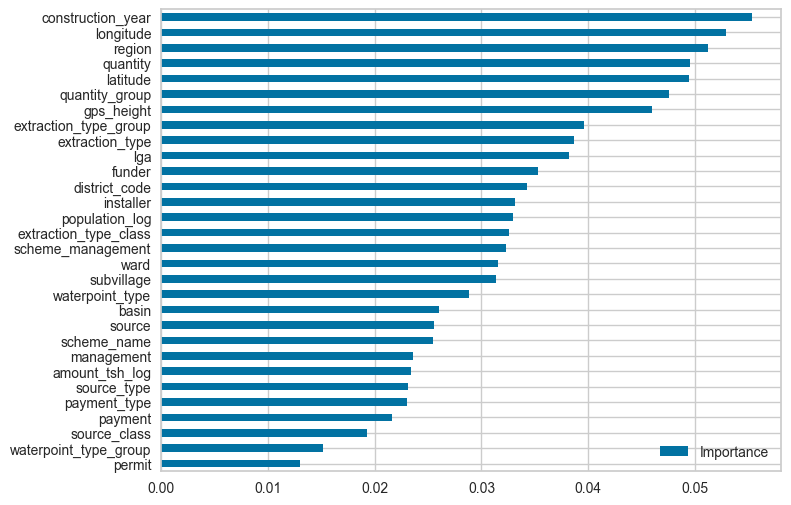

In [164]:
# smote_enn = SMOTEENN(random_state=0, n_jobs=-1)
# data_res_enn = sampling_method_con_split(data_itImp, 'status_group', smote_enn)

Before:
0.0    25807
2.0    18259
1.0     3454
Name: status_group, dtype: int64
Shape:  (47520, 30)
After:
1.0    24792
2.0    22764
0.0    22479
Name: status_group, dtype: int64
Shape:  (70035, 31)
Modelo:
matriz de confusión
[[5590  251  611]
 [ 412  328  123]
 [ 902  107 3556]]
accuracy
0.7974747474747474
precision
0.792980227842991
recall
0.7974747474747474
f1
0.7940012669932485
ROC-AUC OvR: 
0.8869113207791809
ROC-AUC OvO: 
0.8741884499653197
None
              precision    recall  f1-score   support

         0.0       0.81      0.87      0.84      6452
         1.0       0.48      0.38      0.42       863
         2.0       0.83      0.78      0.80      4565

    accuracy                           0.80     11880
   macro avg       0.71      0.68      0.69     11880
weighted avg       0.79      0.80      0.79     11880



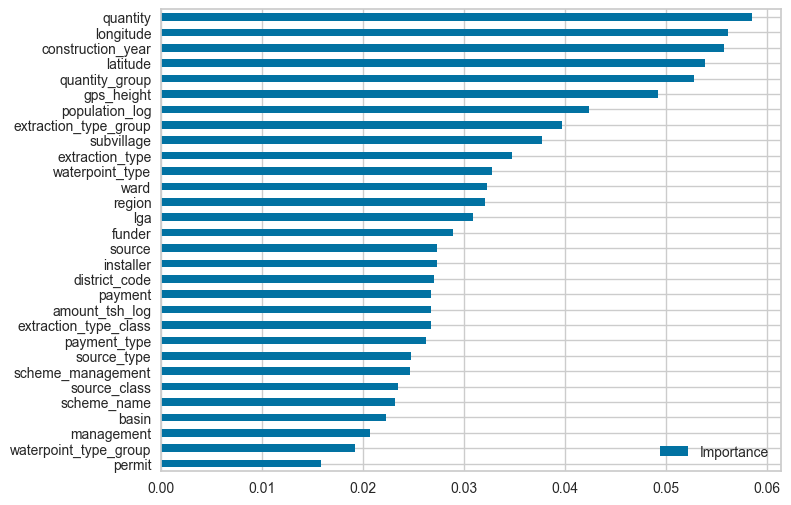

In [165]:
# smt = SMOTETomek(random_state=0)
# data_res_smt = sampling_method_con_split(data_itImp, 'status_group', smt)

Before:
0.0    25807
2.0    18259
1.0     3454
Name: status_group, dtype: int64
Shape:  (47520, 30)
After:
0.0    25807
2.0    23000
1.0    12000
Name: status_group, dtype: int64
Shape:  (60807, 31)
Modelo:
matriz de confusión
[[5635  229  588]
 [ 434  304  125]
 [ 897   82 3586]]
accuracy
0.8017676767676768
precision
0.7957645031401384
recall
0.8017676767676768
f1
0.7969497717728904
ROC-AUC OvR: 
0.8917048573477636
ROC-AUC OvO: 
0.8780691174750089
None
              precision    recall  f1-score   support

         0.0       0.81      0.87      0.84      6452
         1.0       0.49      0.35      0.41       863
         2.0       0.83      0.79      0.81      4565

    accuracy                           0.80     11880
   macro avg       0.71      0.67      0.69     11880
weighted avg       0.80      0.80      0.80     11880



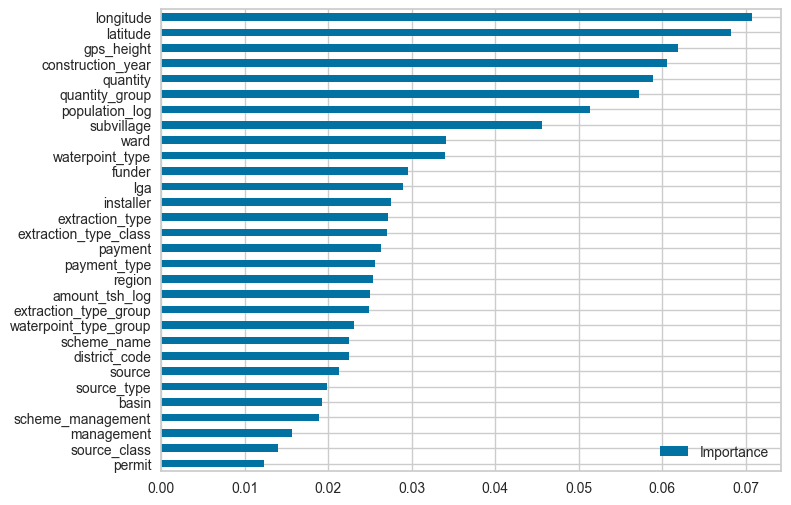

In [173]:
# sm = SMOTE(random_state=2, n_jobs=-1, sampling_strategy={1.0: 12000, 2:23000})
# data_res_sm = sampling_method_con_split(data_itImp, 'status_group', sm)

El único método de remuestreo que parece mejorar (muy levemente) el modelo es SMOTE. Probaremos a realizar una validación cruzada para comprobar el overfitting.

In [177]:

# cross_validation(RandomForestClassifier(random_state=42), data_res_sm, 'status_group')

0.8133233395274603
0.025112527029578873


array([0.76929426, 0.82377218, 0.84632318, 0.81075875, 0.81646832])

In [179]:
# cross_validation(RandomForestClassifier(random_state=42), data_itImp, 'status_group')

0.8075925925925926
0.0014573719264531315


array([0.80951178, 0.80774411, 0.80841751, 0.80513468, 0.80715488])

A juzgar por los resultados, parece que el modelo sin remuestreo es mucho más robusto, así que decidiremos prescindir del remuestreo.

## Estandarización de los datos

Vamos a probar a estandarizar los datos para observar si logramos una mejora en el modelo.

In [216]:
#introducimos cambios a la función que estábamos usando para poder utilizarla en esta fase

def probar_modelo(data, y_col_name, model):
    X_train, X_test, y_train, y_test = train_test_split(data.drop(y_col_name,axis=1),
                                                        data[y_col_name],
                                                        test_size=0.2,
                                                        random_state=42,
                                                        stratify = data[y_col_name])

    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)

    print(saca_metricas(y_test, y_pred, y_proba))
    print(classification_report(y_test, y_pred))

In [217]:
a_escalar = ['gps_height', 'longitude', 'latitude', 'construction_year', 'amount_tsh_log', 'population_log']

In [218]:
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)

pipeline = Pipeline([
    ("scaler", ct),
    ("rf", RandomForestClassifier(random_state=42))
])

probar_modelo(data_itImp, 'status_group', pipeline)

matriz de confusión
[[5706  181  565]
 [ 465  271  127]
 [ 950   62 3553]]
accuracy
0.8021885521885522
precision
0.7950990420777966
recall
0.8021885521885522
f1
0.7951595090173466
ROC-AUC OvR: 
0.8912140668073468
ROC-AUC OvO: 
0.8764241950845344
None
              precision    recall  f1-score   support

         0.0       0.80      0.88      0.84      6452
         1.0       0.53      0.31      0.39       863
         2.0       0.84      0.78      0.81      4565

    accuracy                           0.80     11880
   macro avg       0.72      0.66      0.68     11880
weighted avg       0.80      0.80      0.80     11880



El modelo mejora en centésimas.

## Comparación de modelos con diferente hiperparámetros

Hemos comentado los GridSearch que hemos utilizado porque necesitan mucho tiempo de ejecución, pero hemos dejado capturas con los resultados obtenidos en cada una.

In [36]:
#diccionario de modelos con diferentes hiperparámetros

# param_grid = {
#     'tree': {
#         'model': DecisionTreeClassifier(random_state=42),
#         'params' : {
#             'min_samples_split': [2, 6]
#         }  
#     },
#     'rf': {
#         'model': RandomForestClassifier(random_state=42),
#         'params' : {
#             'n_estimators': [50, 100, 200],
#             'max_depth':  [None, 5],
#             'max_features': ['sqrt', 'log2']
#         }
#     },
#     'xgb_clf' : {
#         'model': XGBClassifier(random_state=42, verbosity=0),
#         'params': {
#             'learning_rate': [0.01, 0.05, 0.2],
#             'n_estimators': [50, 100, 300]
#         }
#     },
#     'SVC': {
#         'model': SVC(random_state=42),
#         'params' : {
#             'C': [1, 5, 10],
#         }  
#     }
# }

In [37]:
#hemos optado por realizar un HalvingGridSearch porque si no el tiempo de ejecución es demasiado elevado, de hecho ha tardado 72 minutos

# scores = []


# for model_name, mp in param_grid.items():
#     print('MODELO', model_name)

#     clf =  HalvingGridSearchCV(mp['model'], mp['params'], cv=3, return_train_score=False, verbose=1, n_jobs=-1)
    
#     clf.fit(data_itImp.drop(columns='status_group'), data_itImp.status_group)

#     scores.append({
#         'model': model_name,
#         'best_score': clf.best_score_,
#         'best_params': clf.best_params_
#     })
    
# df = pd.DataFrame(scores,columns=['model','best_score','best_params'])
# df

MODELO tree
n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 59400
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 2
n_resources: 59400
Fitting 3 folds for each of 2 candidates, totalling 6 fits
MODELO rf
n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 6600
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 12
n_resources: 6600
Fitting 3 folds for each of 12 candidates, totalling 36 fits
----------
iter: 1
n_candidates: 4
n_resources: 19800
Fitting 3 folds for each of 4 candidates, totalling 12 fits
----------
iter: 2
n_candidates: 2
n_resources: 59400
Fitting 3 folds for each of 2 candidates, totalling 6 fits
MODELO xgb_clf
n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 6600
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 9
n_resources: 6600
Fitting

,model,best_score,best_params
0,tree,0.746987,{'min_samples_split': 6}
1,rf,0.803535,"{'max_depth': None, 'max_features': 'log2', 'n..."
2,xgb_clf,0.793451,"{'learning_rate': 0.2, 'n_estimators': 100}"
3,SVC,0.545286,{'C': 10}


In [40]:
#df.best_params[1]

{'max_depth': None, 'max_features': 'log2', 'n_estimators': 200}

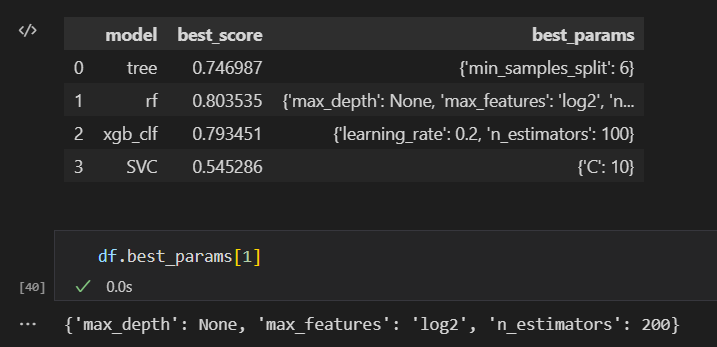

Visto los resultados, decidimos descartar SVC y el árbol de decisiones. Seguiremos probando hiperparámetros con RandomForest y XGBoost.

In [42]:
# param_grid2 = {
#     'rf': {
#         'model': RandomForestClassifier(random_state=42),
#         'params' : {
#             'n_estimators': [200, 300],
#             'max_features': ['log2']
#         }
#     },
#     'xgb_clf' : {
#         'model': XGBClassifier(random_state=42, verbosity=0),
#         'params': {
#             'learning_rate': [0.2, 0.3, 0.5],
#             'n_estimators': [100, 150, 200]
#         }
#     }
# }

In [43]:
# scores = []


# for model_name, mp in param_grid2.items():
#     print('MODELO', model_name)

#     clf =  GridSearchCV(mp['model'], mp['params'], cv=3, return_train_score=False, verbose=1, n_jobs=-1)
    
#     clf.fit(data_itImp.drop(columns='status_group'), data_itImp.status_group)

#     scores.append({
#         'model': model_name,
#         'best_score': clf.best_score_,
#         'best_params': clf.best_params_
#     })
    
# df2 = pd.DataFrame(scores,columns=['model','best_score','best_params'])
# df2

MODELO rf
Fitting 3 folds for each of 2 candidates, totalling 6 fits
MODELO xgb_clf
Fitting 3 folds for each of 9 candidates, totalling 27 fits


,model,best_score,best_params
0,rf,0.804024,"{'max_features': 'log2', 'n_estimators': 300}"
1,xgb_clf,0.803670,"{'learning_rate': 0.3, 'n_estimators': 200}"


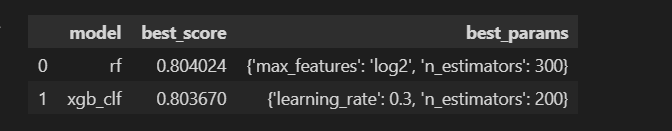

Realizaremos otra iteración para ver si logramos encontrar aún mejores parámetros.

In [44]:
# param_grid3 = {
#     'rf': {
#         'model': RandomForestClassifier(random_state=42),
#         'params' : {
#             'n_estimators': [300, 400],
#             'max_features': ['log2'],
#             'min_samples_split': [2, 4, 6]
#         }
#     },
#     'xgb_clf' : {
#         'model': XGBClassifier(random_state=42, verbosity=0),
#         'params': {
#             'learning_rate': [0.3],
#             'n_estimators': [200, 300, 400],
#             'max_depth': [3, 6, 10],
#             'subsample': [0.6, 0.8, 1.0]
#         }
#     }
# }

In [45]:
# scores = []


# for model_name, mp in param_grid3.items():
#     print('MODELO', model_name)

#     clf =  GridSearchCV(mp['model'], mp['params'], cv=3, return_train_score=False, verbose=1, n_jobs=-1)
    
#     clf.fit(data_itImp.drop(columns='status_group'), data_itImp.status_group)

#     scores.append({
#         'model': model_name,
#         'best_score': clf.best_score_,
#         'best_params': clf.best_params_
#     })
    
# df3 = pd.DataFrame(scores,columns=['model','best_score','best_params'])
# df3

MODELO rf
Fitting 3 folds for each of 6 candidates, totalling 18 fits
MODELO xgb_clf
Fitting 3 folds for each of 27 candidates, totalling 81 fits


,model,best_score,best_params
0,rf,0.807912,"{'max_features': 'log2', 'min_samples_split': ..."
1,xgb_clf,0.803687,"{'learning_rate': 0.3, 'max_depth': 6, 'n_esti..."


In [47]:
df3.best_params[0]

{'max_features': 'log2', 'min_samples_split': 6, 'n_estimators': 400}

In [48]:
df3.best_params[1]

{'learning_rate': 0.3, 'max_depth': 6, 'n_estimators': 300, 'subsample': 1.0}

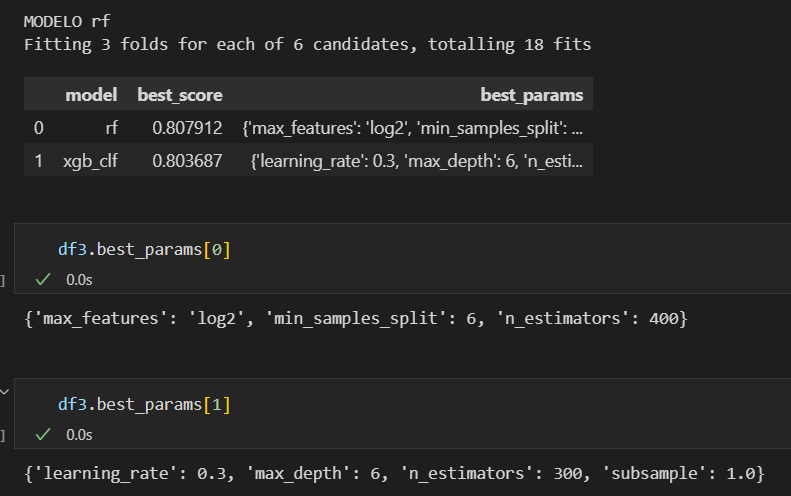

A continuación, compararemos el modelo random forest con xgboost.

In [219]:
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)

rf_pipeline = Pipeline([
    ("scaler", ct),
    ("rf", RandomForestClassifier(max_features= 'log2', min_samples_split= 6, n_estimators= 400, random_state=42, n_jobs=-1))
])

probar_modelo(data_itImp, 'status_group', rf_pipeline)

matriz de confusión
[[5808  123  521]
 [ 483  254  126]
 [ 972   42 3551]]
accuracy
0.8091750841750842
precision
0.8033721135545201
recall
0.8091750841750842
f1
0.8001890841198068
ROC-AUC OvR: 
0.9002422722139974
ROC-AUC OvO: 
0.885771795085911
None
              precision    recall  f1-score   support

         0.0       0.80      0.90      0.85      6452
         1.0       0.61      0.29      0.40       863
         2.0       0.85      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.75      0.66      0.68     11880
weighted avg       0.80      0.81      0.80     11880



In [220]:
cross_validation(rf_pipeline, data_itImp, 'status_group')

0.8114309764309764
0.0032094448470821684


array([0.81776094, 0.81001684, 0.81018519, 0.80883838, 0.81035354])

In [221]:
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)

xgb_pipeline = Pipeline([
    ("scaler", ct),
    ("xgb", XGBClassifier(random_state=42, verbosity=0, learning_rate= 0.3, max_depth=6, n_estimators= 300, subsample= 1.0, n_jobs=-1))
])

probar_modelo(data_itImp, 'status_group', xgb_pipeline)

matriz de confusión
[[5787  141  524]
 [ 480  251  132]
 [1004   54 3507]]
accuracy
0.8034511784511784
precision
0.7968425418242078
recall
0.8034511784511784
f1
0.7947065898495144
ROC-AUC OvR: 
0.8967823115469118
ROC-AUC OvO: 
0.881751898706225
None
              precision    recall  f1-score   support

         0.0       0.80      0.90      0.84      6452
         1.0       0.56      0.29      0.38       863
         2.0       0.84      0.77      0.80      4565

    accuracy                           0.80     11880
   macro avg       0.73      0.65      0.68     11880
weighted avg       0.80      0.80      0.79     11880



In [222]:
cross_validation(xgb_pipeline, data_itImp, 'status_group')

0.807070707070707
0.0048492447028970044


array([0.81304714, 0.81060606, 0.80816498, 0.7993266 , 0.80420875])

El modelo que mejor resultado nos ha dado es RandomForest, así que probaremos a realizar una predicción con este.

# Predicción 3

In [70]:
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)

model3 = Pipeline([
    ("scaler", ct),
    ("rf", RandomForestClassifier(max_features= 'log2', min_samples_split= 6, n_estimators= 400, random_state=42, n_jobs=-1))
])

model3.fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])
y_pred = model3.predict(test_itImp)

tercera_pred = pd.DataFrame(data= zip(indices_test, y_pred), columns=['id', 'status_group'])

reverse_map = {v: k for k, v in encoding_map.items()}
tercera_pred.status_group = tercera_pred.status_group.map(reverse_map)

tercera_pred.to_csv('tercer_intento.csv', index=False)

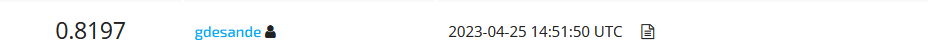

# Cuarto intento

Vamos a tratar de mejorar un poco más si es posible el tuneo del random forest y vamos a probar otro modelo (BaggingClassifier). El objetivo es combinar modelos mediante votación.

In [226]:
# param_grid4 = {
#     'rf': {
#         'model': RandomForestClassifier(random_state=42),
#         'params' : {
#             'n_estimators': [400, 500],
#             'max_features': ['log2'],
#             'min_samples_split': [6, 8]
#         }
#     },
#     'bagg_clf': {
#         'model': BaggingClassifier(random_state=42),
#         'params' : {
#             'n_estimators': [100, 400],
#             'max_features': [0.2, 0.8, 1.0]
#         }
#     }
# }

In [228]:
# scores = []


# for model_name, mp in param_grid4.items():
#     print('MODELO', model_name)

#     clf =  GridSearchCV(mp['model'], mp['params'], cv=3, return_train_score=False, verbose=1, n_jobs=-1)
    
#     clf.fit(data_itImp.drop(columns='status_group'), data_itImp.status_group)

#     scores.append({
#         'model': model_name,
#         'best_score': clf.best_score_,
#         'best_params': clf.best_params_
#     })
    
# df4 = pd.DataFrame(scores,columns=['model','best_score','best_params'])
# df4

MODELO rf
Fitting 3 folds for each of 4 candidates, totalling 12 fits
MODELO bagg_clf
Fitting 3 folds for each of 6 candidates, totalling 18 fits


,model,best_score,best_params
0,rf,0.807912,"{'max_features': 'log2', 'min_samples_split': ..."
1,bagg_clf,0.802997,"{'max_features': 0.8, 'n_estimators': 400}"


In [229]:
# df4.best_params[0]

{'max_features': 'log2', 'min_samples_split': 6, 'n_estimators': 400}

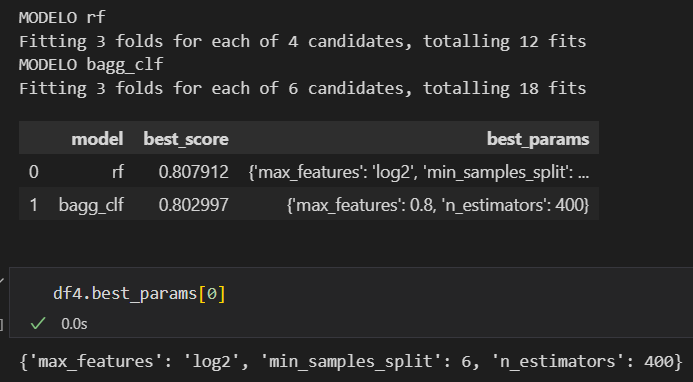

El randomforest parece haber tocado techo con estos parámetros, vamos a tratar de mejorar un poco más el bagging.

In [230]:
# grid_param = {
#     'n_estimators': [300, 400, 500],
#     'max_features': [0.8],
#     'max_samples': [0.8, 1.0]
# }

# bg = BaggingClassifier(random_state=42, n_jobs=-1)

# bagg_grid = GridSearchCV(estimator=bg,
#                      param_grid=grid_param,
#                      cv=3,
#                      n_jobs=-1)

# bagg_grid.fit(data_itImp.drop(columns='status_group'), data_itImp.status_group)

# print(bagg_grid.best_params_)
# print(bagg_grid.best_score_)

{'max_features': 0.8, 'max_samples': 0.8, 'n_estimators': 500}
0.8054377104377105


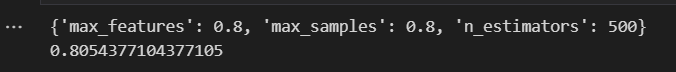

In [231]:
# grid_param2 = {
#     'n_estimators': [500, 600],
#     'max_features': [0.8],
#     'max_samples': [0.6, 0.8]
# }

# bg = BaggingClassifier(random_state=42, n_jobs=-1)

# bagg_grid2 = GridSearchCV(estimator=bg,
#                      param_grid=grid_param,
#                      cv=3,
#                      n_jobs=-1)

# bagg_grid2.fit(data_itImp.drop(columns='status_group'), data_itImp.status_group)

# print(bagg_grid2.best_params_)
# print(bagg_grid2.best_score_)

{'max_features': 0.8, 'max_samples': 0.8, 'n_estimators': 500}
0.8054377104377105


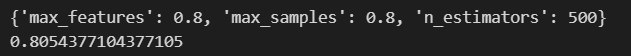

Parece que estos parámetros son los mejores, vamos a realizar una prueba con el sistema de votación.

In [233]:

bagg_pipe = Pipeline([
    ("scaler", ct),
    ("bagg", BaggingClassifier(random_state=42, n_jobs=-1, max_features= 0.8, max_samples= 0.8, n_estimators= 500))
])

#asignamos los pesos en función de los scores que han obtenido los modelos
vc1 = VotingClassifier([('rf', rf_pipeline), ('xgb', xgb_pipeline), ('bagg', bagg_pipe)], voting = 'soft', weights = [0.8197, 0.807, 0.805])

probar_modelo(data_itImp, 'status_group', vc1)

matriz de confusión
[[5834  123  495]
 [ 487  253  123]
 [ 961   41 3563]]
accuracy
0.8122895622895623
precision
0.8066395343484372
recall
0.8122895622895623
f1
0.8032002762141414
ROC-AUC OvR: 
0.903466683826578
ROC-AUC OvO: 
0.8892146379092726
None
              precision    recall  f1-score   support

         0.0       0.80      0.90      0.85      6452
         1.0       0.61      0.29      0.40       863
         2.0       0.85      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.75      0.66      0.69     11880
weighted avg       0.81      0.81      0.80     11880



In [234]:
cross_validation(vc1, data_itImp, 'status_group')

0.8136026936026937
0.002964875415858764


array([0.81885522, 0.81397306, 0.81161616, 0.81010101, 0.81346801])

Los resultados parecen ser mejores! Vamos a probar también usando solamente randomForest y xgboost.

In [241]:
vc2 = VotingClassifier([('rf', rf_pipeline), ('xgb', xgb_pipeline)], voting = 'soft', weights = [0.8197, 0.807])

probar_modelo(data_itImp, 'status_group', vc2)

matriz de confusión
[[5834  124  494]
 [ 481  253  129]
 [ 975   44 3546]]
accuracy
0.8108585858585858
precision
0.8051189619118999
recall
0.8108585858585858
f1
0.8017765107646905
ROC-AUC OvR: 
0.9043372444955046
ROC-AUC OvO: 
0.8900042106686601
None
              precision    recall  f1-score   support

         0.0       0.80      0.90      0.85      6452
         1.0       0.60      0.29      0.39       863
         2.0       0.85      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.75      0.66      0.69     11880
weighted avg       0.81      0.81      0.80     11880



In [224]:
cross_validation(vc2, data_itImp, 'status_group')

0.8134175084175084
0.003148913283205772


array([0.81843434, 0.81313131, 0.81186869, 0.80892256, 0.81473064])

Todas las métricas del primer clasificador por votación son mejores salvo los valores ROC-AUC. Realizaremos una predicción con el primero y otra con el segundo a ver cuál logra mejor resultado final.

# Predicciones finales

In [236]:
vc1.fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])
y_pred = vc1.predict(test_itImp)

cuarta_pred = pd.DataFrame(data= zip(indices_test, y_pred), columns=['id', 'status_group'])

reverse_map = {v: k for k, v in encoding_map.items()}
cuarta_pred.status_group = cuarta_pred.status_group.map(reverse_map)

cuarta_pred.to_csv('cuarto_intento.csv', index=False)

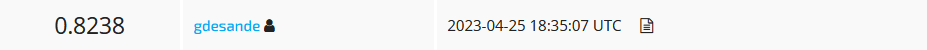

0.8238! El mejor resultado hasta ahora.

In [242]:
vc2.fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])
y_pred = vc2.predict(test_itImp)

quinta_pred = pd.DataFrame(data= zip(indices_test, y_pred), columns=['id', 'status_group'])

reverse_map = {v: k for k, v in encoding_map.items()}
quinta_pred.status_group = quinta_pred.status_group.map(reverse_map)

quinta_pred.to_csv('quinto_intento.csv', index=False)

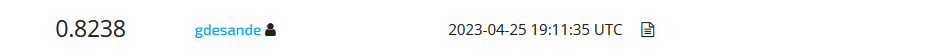

El score ha sido el mismo en los dos casos. Por ende, el mejor modelo es el segundo puesto que es más sencillo. Se podrían seguir probando más cosas, pero estamos muy satisfechos con este resultado final así que lo dejaremos aquí.